In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (classification_report, confusion_matrix,
                             roc_auc_score, RocCurveDisplay,
                             precision_recall_curve, auc)
from sklearn.feature_selection import mutual_info_classif, chi2, f_classif
from sklearn.preprocessing import MinMaxScaler
from matplotlib.patches import Patch

#Load data

In [2]:
import kagglehub

path = kagglehub.dataset_download("kamilpytlak/personal-key-indicators-of-heart-disease")
print("Path to dataset files:", path)

data = pd.read_csv(os.path.join(path, '2022', 'heart_2022_no_nans.csv'))
print("Shape:", data.shape)
data.head()

Using Colab cache for faster access to the 'personal-key-indicators-of-heart-disease' dataset.
Path to dataset files: /kaggle/input/personal-key-indicators-of-heart-disease
Shape: (246022, 40)


,State,Sex,GeneralHealth,PhysicalHealthDays,MentalHealthDays,LastCheckupTime,PhysicalActivities,SleepHours,RemovedTeeth,HadHeartAttack,...,HeightInMeters,WeightInKilograms,BMI,AlcoholDrinkers,HIVTesting,FluVaxLast12,PneumoVaxEver,TetanusLast10Tdap,HighRiskLastYear,CovidPos
0,Alabama,Female,Very good,4.0,0.0,Within past year (anytime less than 12 months ...,Yes,9.0,None of them,No,...,1.60,71.67,27.99,No,No,Yes,Yes,"Yes, received Tdap",No,No
1,Alabama,Male,Very good,0.0,0.0,Within past year (anytime less than 12 months ...,Yes,6.0,None of them,No,...,1.78,95.25,30.13,No,No,Yes,Yes,"Yes, received tetanus shot but not sure what type",No,No
2,Alabama,Male,Very good,0.0,0.0,Within past year (anytime less than 12 months ...,No,8.0,"6 or more, but not all",No,...,1.85,108.86,31.66,Yes,No,No,Yes,"No, did not receive any tetanus shot in the pa...",No,Yes
3,Alabama,Female,Fair,5.0,0.0,Within past year (anytime less than 12 months ...,Yes,9.0,None of them,No,...,1.70,90.72,31.32,No,No,Yes,Yes,"No, did not receive any tetanus shot in the pa...",No,Yes
4,Alabama,Female,Good,3.0,15.0,Within past year (anytime less than 12 months ...,Yes,5.0,1 to 5,No,...,1.55,79.38,33.07,No,No,Yes,Yes,"No, did not receive any tetanus shot in the pa...",No,No


In [3]:
pd.set_option('display.max_columns', None)
print("Shape:", data.shape)
print("\nDtypes:\n", data.dtypes)
print("\nMissing values:", data.isnull().sum().sum())
data.describe()

Shape: (246022, 40)

Dtypes:
 State                         object
Sex                           object
GeneralHealth                 object
PhysicalHealthDays           float64
MentalHealthDays             float64
LastCheckupTime               object
PhysicalActivities            object
SleepHours                   float64
RemovedTeeth                  object
HadHeartAttack                object
HadAngina                     object
HadStroke                     object
HadAsthma                     object
HadSkinCancer                 object
HadCOPD                       object
HadDepressiveDisorder         object
HadKidneyDisease              object
HadArthritis                  object
HadDiabetes                   object
DeafOrHardOfHearing           object
BlindOrVisionDifficulty       object
DifficultyConcentrating       object
DifficultyWalking             object
DifficultyDressingBathing     object
DifficultyErrands             object
SmokerStatus                  object
ECigaret

,PhysicalHealthDays,MentalHealthDays,SleepHours,HeightInMeters,WeightInKilograms,BMI
count,246022.000000,246022.000000,246022.000000,246022.000000,246022.000000,246022.000000
mean,4.119026,4.167140,7.021331,1.705150,83.615179,28.668136
std,8.405844,8.102687,1.440681,0.106654,21.323156,6.513973
min,0.000000,0.000000,1.000000,0.910000,28.120000,12.020000
25%,0.000000,0.000000,6.000000,1.630000,68.040000,24.270000
50%,0.000000,0.000000,7.000000,1.700000,81.650000,27.460000
75%,3.000000,4.000000,8.000000,1.780000,95.250000,31.890000
max,30.000000,30.000000,24.000000,2.410000,292.570000,97.650000


#Outlier detection

In [4]:
numeric_cols = ['PhysicalHealthDays', 'MentalHealthDays', 'SleepHours',
                'HeightInMeters', 'WeightInKilograms', 'BMI']

for col in numeric_cols:
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    n = ((data[col] < lower) | (data[col] > upper)).sum()
    pct = round(n / len(data) * 100, 2)
    print(f"{col}: {n} outliers ({pct}%) | range [{round(lower,2)}, {round(upper,2)}]")

PhysicalHealthDays: 38810 outliers (15.78%) | range [-4.5, 7.5]
MentalHealthDays: 32714 outliers (13.3%) | range [-6.0, 10.0]
SleepHours: 3488 outliers (1.42%) | range [3.0, 11.0]
HeightInMeters: 830 outliers (0.34%) | range [1.4, 2.01]
WeightInKilograms: 5940 outliers (2.41%) | range [27.23, 136.06]
BMI: 7563 outliers (3.07%) | range [12.84, 43.32]


#Value counts (categorical only)

In [5]:
for col in data.select_dtypes(include='object').columns:
    print(f"Value counts for '{col}':")
    print(data[col].value_counts())
    print("-" * 40)

Value counts for 'State':
State
Washington              15000
Maryland                 9165
Minnesota                9161
Ohio                     8995
New York                 8923
Texas                    7408
Florida                  7315
Kansas                   6145
Wisconsin                6126
Maine                    6013
Iowa                     5672
Hawaii                   5596
Virginia                 5565
Indiana                  5502
South Carolina           5471
Massachusetts            5465
Arizona                  5462
Utah                     5373
Michigan                 5370
Colorado                 5159
Nebraska                 5107
California               5096
Connecticut              5053
Georgia                  4978
Vermont                  4845
South Dakota             4405
Montana                  4264
Missouri                 4195
New Jersey               3967
New Hampshire            3756
Puerto Rico              3589
Idaho                    3468
Alaska  

#Target distribution

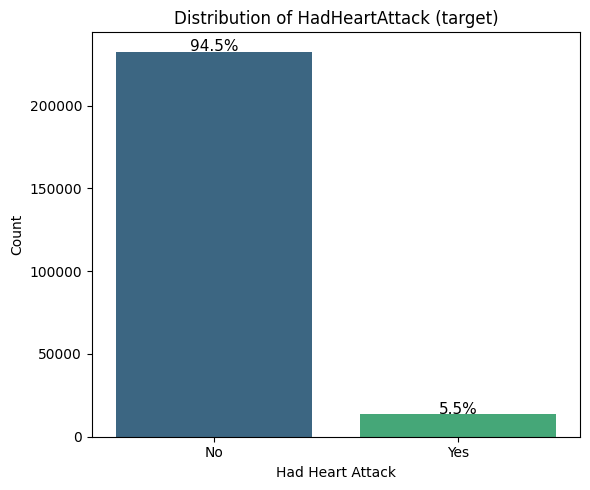

HadHeartAttack
No     232587
Yes     13435
Name: count, dtype: int64

Class imbalance ratio: 17.3:1


In [6]:
plt.figure(figsize=(6, 5))
sns.countplot(x='HadHeartAttack', data=data, palette='viridis')
plt.title('Distribution of HadHeartAttack (target)')
plt.xlabel('Had Heart Attack')
plt.ylabel('Count')

total = len(data)
for p in plt.gca().patches:
    pct = f"{100 * p.get_height() / total:.1f}%"
    plt.gca().annotate(pct, (p.get_x() + p.get_width() / 2, p.get_height() + 500),
                       ha='center', fontsize=11)
plt.tight_layout()
plt.show()

print(data['HadHeartAttack'].value_counts())
print(f"\nClass imbalance ratio: {round(232587/13435, 1)}:1")

# Statistical summary

In [7]:
print(data[numeric_cols].agg(['mean', 'median', 'std', 'skew', 'kurt']).round(2))

        PhysicalHealthDays  MentalHealthDays  SleepHours  HeightInMeters  \
mean                  4.12              4.17        7.02            1.71   
median                0.00              0.00        7.00            1.70   
std                   8.41              8.10        1.44            0.11   
skew                  2.28              2.22        0.56            0.03   
kurt                  3.97              3.86        7.21            0.01   

        WeightInKilograms    BMI  
mean                83.62  28.67  
median              81.65  27.46  
std                 21.32   6.51  
skew                 1.02   1.33  
kurt                 2.34   3.90  


#Univariate: histograms

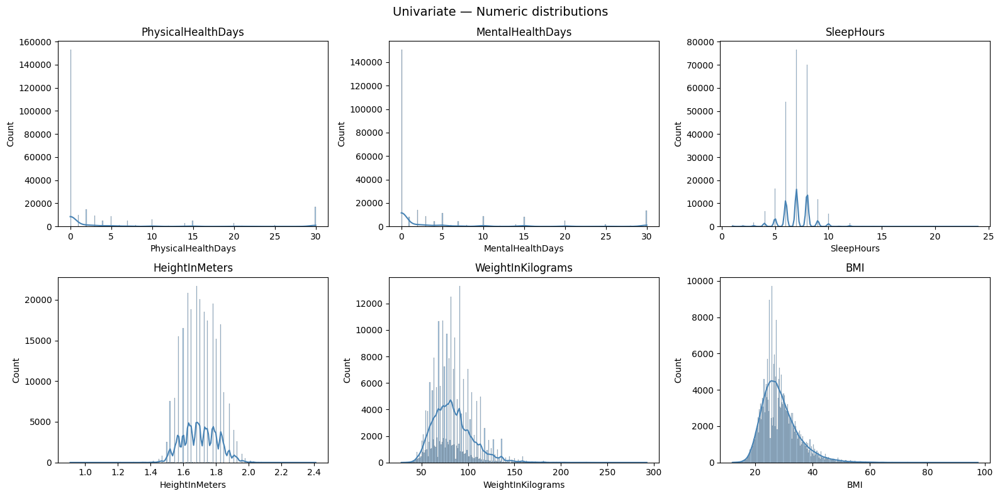

In [8]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))
for ax, col in zip(axes.flatten(), numeric_cols):
    sns.histplot(data[col], kde=True, ax=ax, color='steelblue')
    ax.set_title(col)
plt.suptitle('Univariate — Numeric distributions', fontsize=14)
plt.tight_layout()
plt.show()

#Univariate: boxplots

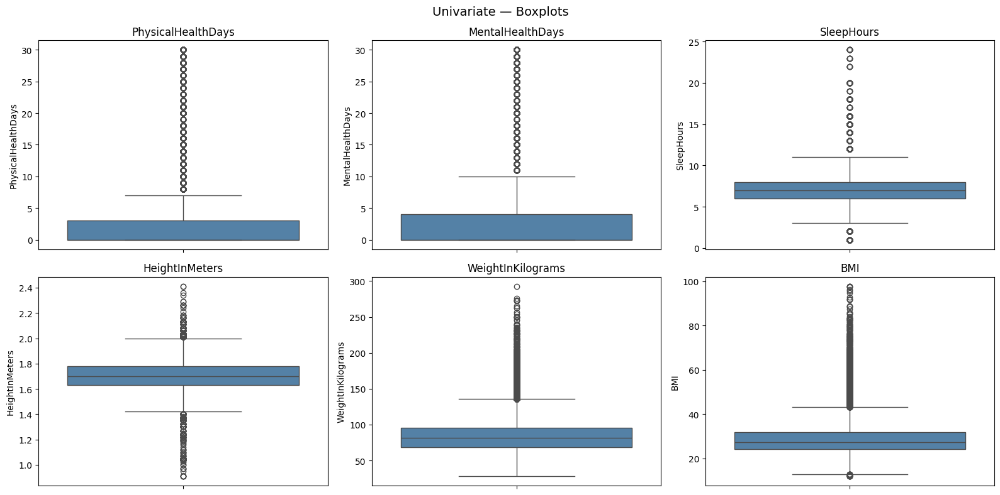

In [9]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))
for ax, col in zip(axes.flatten(), numeric_cols):
    sns.boxplot(y=data[col], ax=ax, color='steelblue')
    ax.set_title(col)
plt.suptitle('Univariate — Boxplots', fontsize=14)
plt.tight_layout()
plt.show()

# violin plots

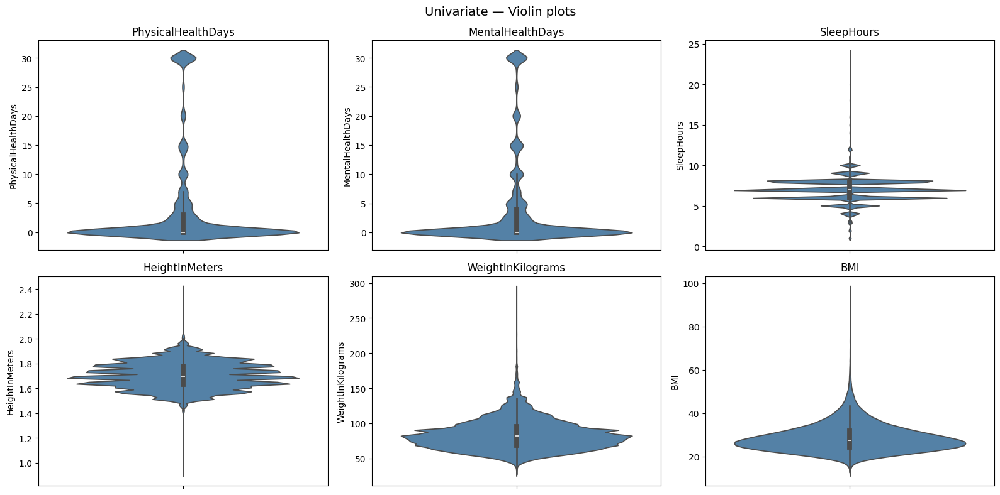

In [10]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))
for ax, col in zip(axes.flatten(), numeric_cols):
    sns.violinplot(y=data[col], ax=ax, color='steelblue')
    ax.set_title(col)
plt.suptitle('Univariate — Violin plots', fontsize=14)
plt.tight_layout()
plt.show()

#Univariate: categorical countplots

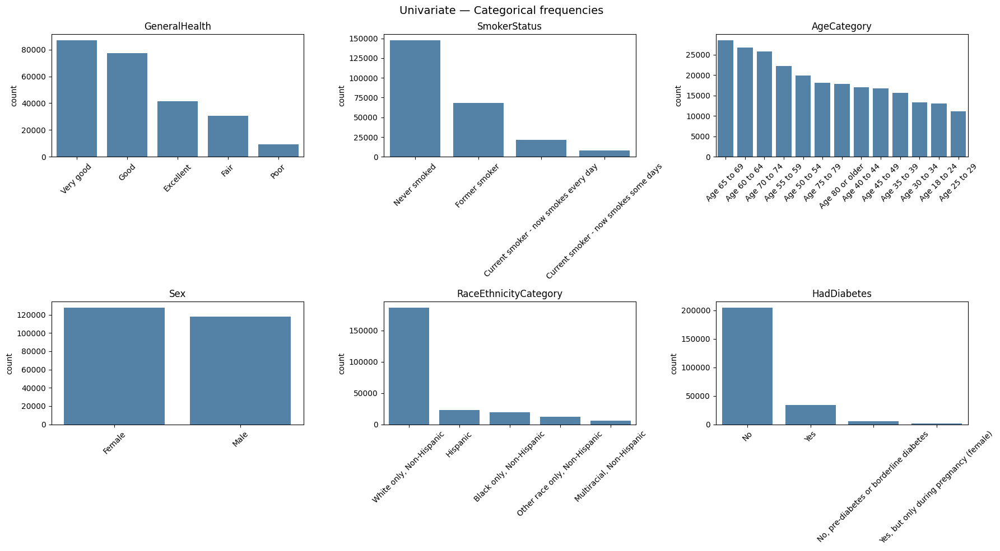

In [11]:
cat_plot_cols = ['GeneralHealth', 'SmokerStatus', 'AgeCategory',
                 'Sex', 'RaceEthnicityCategory', 'HadDiabetes']

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for ax, col in zip(axes.flatten(), cat_plot_cols):
    order = data[col].value_counts().index
    sns.countplot(x=col, data=data, order=order, ax=ax, color='steelblue')
    ax.set_title(col)
    ax.tick_params(axis='x', rotation=45)
    ax.set_xlabel('')
plt.suptitle('Univariate — Categorical frequencies', fontsize=14)
plt.tight_layout()
plt.show()

#Multivariate: numeric vs HadHeartAttack

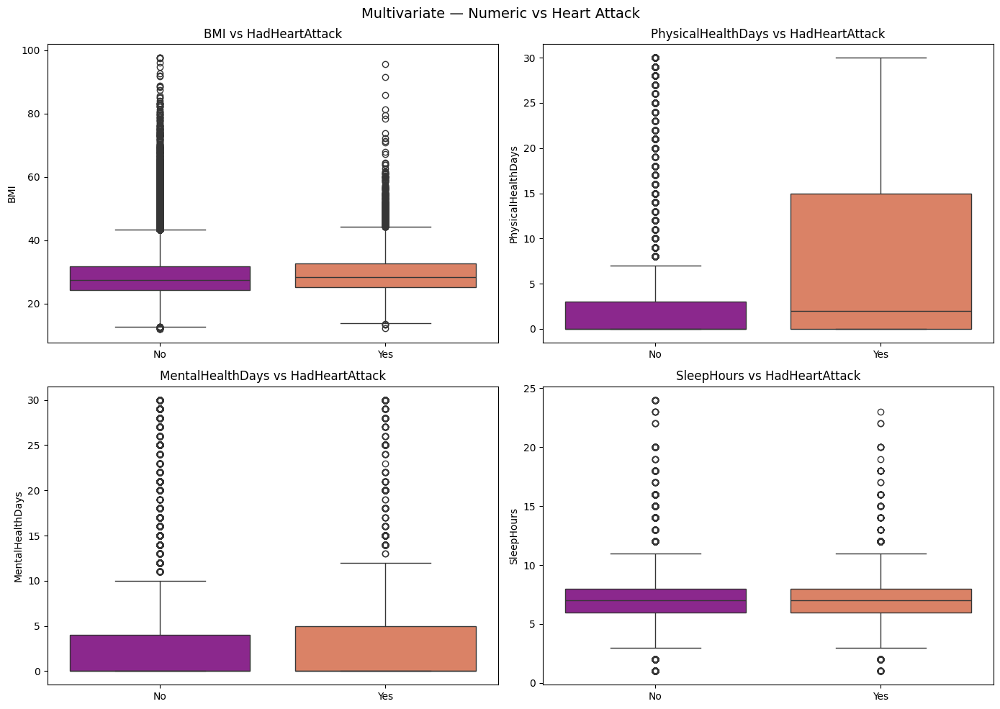

In [12]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
for ax, col in zip(axes.flatten(), ['BMI', 'PhysicalHealthDays',
                                     'MentalHealthDays', 'SleepHours']):
    sns.boxplot(x='HadHeartAttack', y=col, data=data, palette='plasma', ax=ax)
    ax.set_title(f'{col} vs HadHeartAttack')
    ax.set_xlabel('')
plt.suptitle('Multivariate — Numeric vs Heart Attack', fontsize=14)
plt.tight_layout()
plt.show()

#Multivariate: categorical vs HadHeartAttack

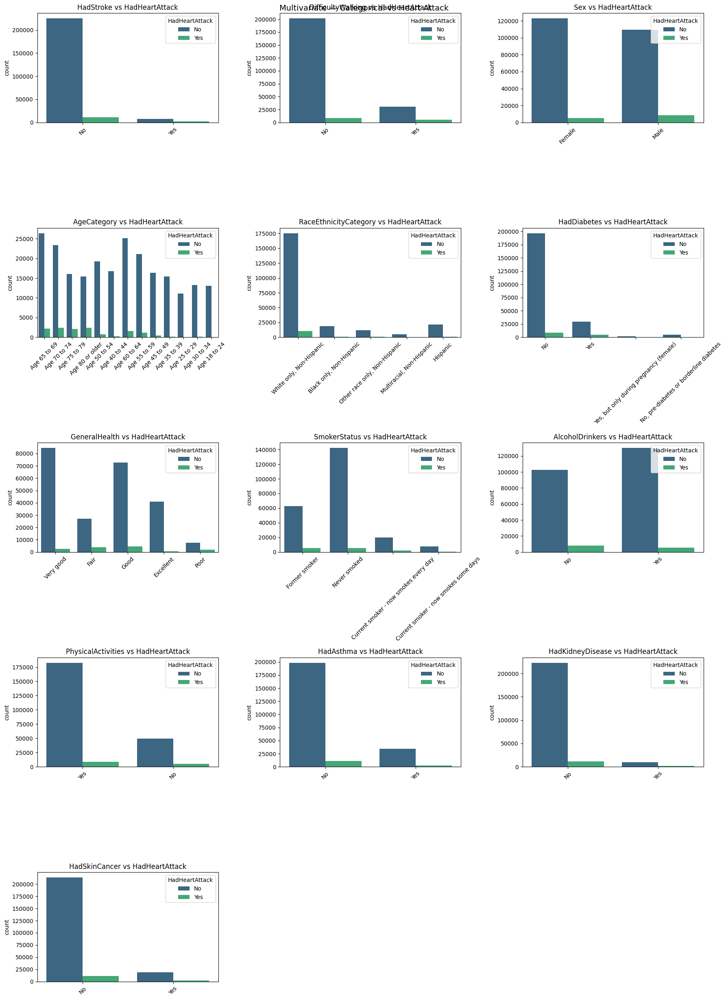

In [13]:
categorical_cols = ['HadStroke', 'DifficultyWalking', 'Sex', 'AgeCategory',
                    'RaceEthnicityCategory', 'HadDiabetes', 'GeneralHealth',
                    'SmokerStatus', 'AlcoholDrinkers', 'PhysicalActivities',
                    'HadAsthma', 'HadKidneyDisease', 'HadSkinCancer']

n_cols = 3
n_rows = (len(categorical_cols) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 5))
axes = axes.flatten()

for i, col in enumerate(categorical_cols):
    sns.countplot(x=col, hue='HadHeartAttack', data=data,
                  palette='viridis', ax=axes[i])
    axes[i].set_title(f'{col} vs HadHeartAttack')
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].set_xlabel('')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle('Multivariate — Categorical vs Heart Attack', fontsize=14)
plt.tight_layout()
plt.show()

#Multivariate: correlation heatmap

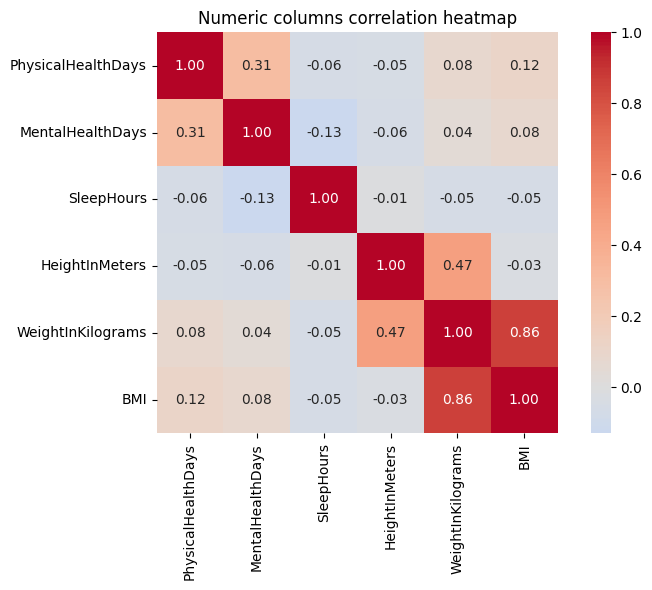

In [14]:
plt.figure(figsize=(8, 6))
sns.heatmap(data[numeric_cols].corr(), annot=True, fmt='.2f',
            cmap='coolwarm', center=0, square=True)
plt.title('Numeric columns correlation heatmap')
plt.tight_layout()
plt.show()

#Multivariate: pairplot

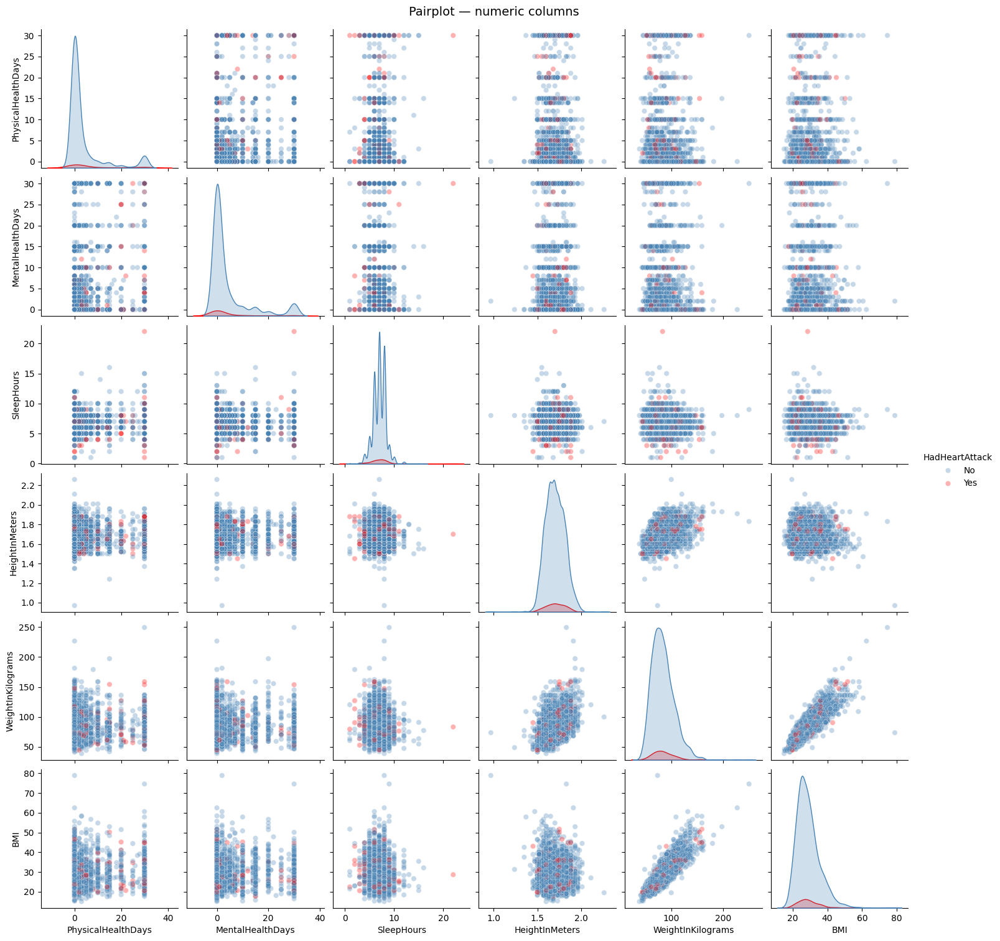

In [15]:
sample = data[numeric_cols + ['HadHeartAttack']].sample(3000, random_state=42).copy()

sns.pairplot(sample, hue='HadHeartAttack',
             palette={'Yes': 'red', 'No': 'steelblue'},
             plot_kws={'alpha': 0.3}, diag_kind='kde')
plt.suptitle('Pairplot — numeric columns', y=1.01, fontsize=14)
plt.show()

#Multivariate: joint distribution plot

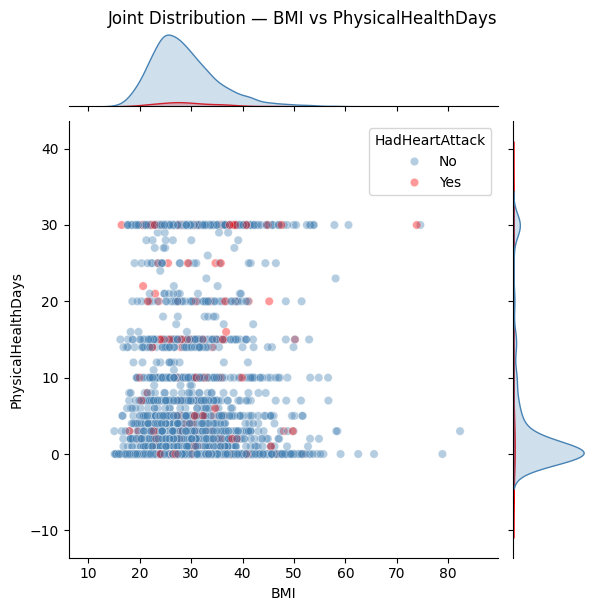

In [16]:
sns.jointplot(data=data.sample(5000, random_state=42),
              x='BMI', y='PhysicalHealthDays',
              hue='HadHeartAttack',
              palette={'Yes': 'red', 'No': 'steelblue'},
              alpha=0.4)
plt.suptitle('Joint Distribution — BMI vs PhysicalHealthDays', y=1.01)
plt.show()

#Multivariate: parallel coordinates

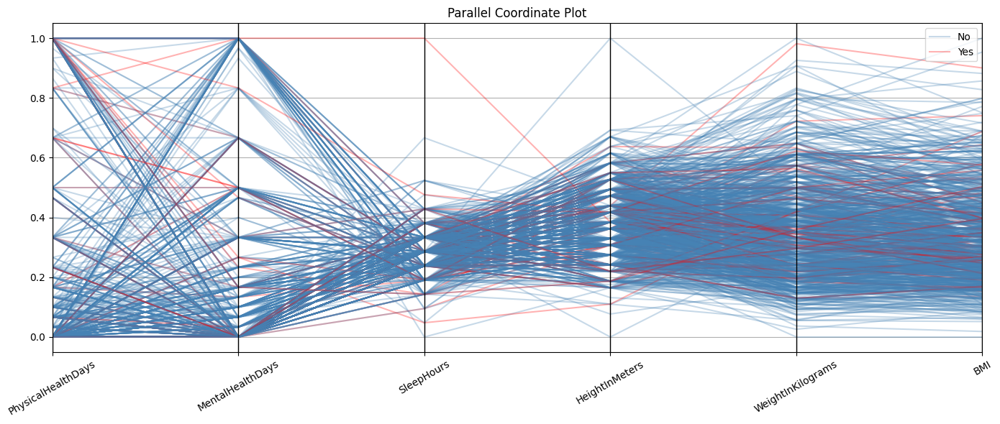

In [17]:
from pandas.plotting import parallel_coordinates

sample_pc = data[numeric_cols + ['HadHeartAttack']].sample(1000, random_state=42).copy()
sample_pc[numeric_cols] = MinMaxScaler().fit_transform(sample_pc[numeric_cols])

plt.figure(figsize=(14, 6))
parallel_coordinates(sample_pc, 'HadHeartAttack',
                     color=['steelblue', 'red'], alpha=0.3)
plt.xticks(rotation=30)
plt.title('Parallel Coordinate Plot')
plt.tight_layout()
plt.show()

#Multivariate: cluster map

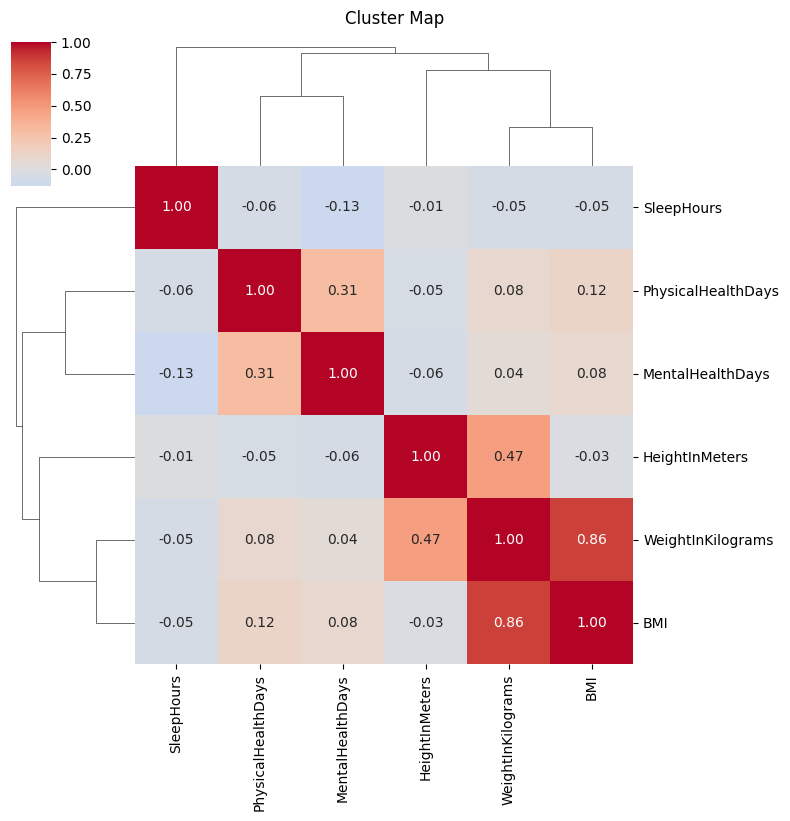

In [18]:
sns.clustermap(data[numeric_cols].corr(), annot=True, fmt='.2f',
               cmap='coolwarm', center=0, figsize=(8, 8))
plt.suptitle('Cluster Map', y=1.02)
plt.show()

#Correlation with target

In [19]:
temp = data.copy()
temp['HeartAttack_enc'] = (temp['HadHeartAttack'] == 'Yes').astype(int)
data_enc = pd.get_dummies(temp.drop(columns=['HadHeartAttack']), drop_first=True)

corr = data_enc.corr()['HeartAttack_enc'] \
               .drop('HeartAttack_enc') \
               .sort_values(ascending=False)

print("Top 10 positively correlated:")
print(corr.head(10))
print("\nTop 10 negatively correlated:")
print(corr.tail(10))

del temp, data_enc

Top 10 positively correlated:
HadAngina_Yes            0.445903
HadStroke_Yes            0.177137
ChestScan_Yes            0.167760
DifficultyWalking_Yes    0.159878
HadDiabetes_Yes          0.145868
GeneralHealth_Poor       0.140607
PhysicalHealthDays       0.133420
HadCOPD_Yes              0.133223
RemovedTeeth_All         0.120564
PneumoVaxEver_Yes        0.119955
Name: HeartAttack_enc, dtype: float64

Top 10 negatively correlated:
LastCheckupTime_Within past 2 years (1 year but less than 2 years ago)   -0.041811
AgeCategory_Age 25 to 29                                                 -0.048216
AgeCategory_Age 40 to 44                                                 -0.049331
AgeCategory_Age 30 to 34                                                 -0.050453
AgeCategory_Age 35 to 39                                                 -0.051119
AlcoholDrinkers_Yes                                                      -0.074181
PhysicalActivities_Yes                                         

#Encode X and define y

In [20]:
#  Target
y = (data['HadHeartAttack'] == 'Yes').astype(int)

#  Drop target from features
df = data.drop(columns=['HadHeartAttack']).copy()

#  Binary columns
binary_cols = ['HadStroke', 'DifficultyWalking', 'AlcoholDrinkers',
               'PhysicalActivities', 'HadAsthma', 'HadKidneyDisease',
               'HadSkinCancer', 'HadAngina', 'ChestScan',
               'FluVaxLast12', 'PneumoVaxEver', 'HIVTesting']
for col in binary_cols:
    df[col] = df[col].map({'Yes': 1, 'No': 0})

df['Sex'] = df['Sex'].map({'Male': 1, 'Female': 0})

#  Ordinal: AgeCategory
age_order = ['Age 18 to 24', 'Age 25 to 29', 'Age 30 to 34', 'Age 35 to 39',
             'Age 40 to 44', 'Age 45 to 49', 'Age 50 to 54', 'Age 55 to 59',
             'Age 60 to 64', 'Age 65 to 69', 'Age 70 to 74', 'Age 75 to 79',
             'Age 80 or older']
df['AgeCategory'] = (df['AgeCategory'].astype('category')
                     .cat.set_categories(age_order, ordered=True).cat.codes)

#  Ordinal: GeneralHealth
health_order = ['Poor', 'Fair', 'Good', 'Very good', 'Excellent']
df['GeneralHealth'] = (df['GeneralHealth'].astype('category')
                       .cat.set_categories(health_order, ordered=True).cat.codes)

#  One-hot encode remaining object columns
object_cols = df.select_dtypes(include='object').columns.tolist()
X = pd.get_dummies(df, columns=object_cols, drop_first=True)

print(f"X shape: {X.shape}")
print(f"y distribution:\n{y.value_counts()}")

X shape: (246022, 107)
y distribution:
HadHeartAttack
0    232587
1     13435
Name: count, dtype: int64


#Feature selection

#Mutual Information — numeric

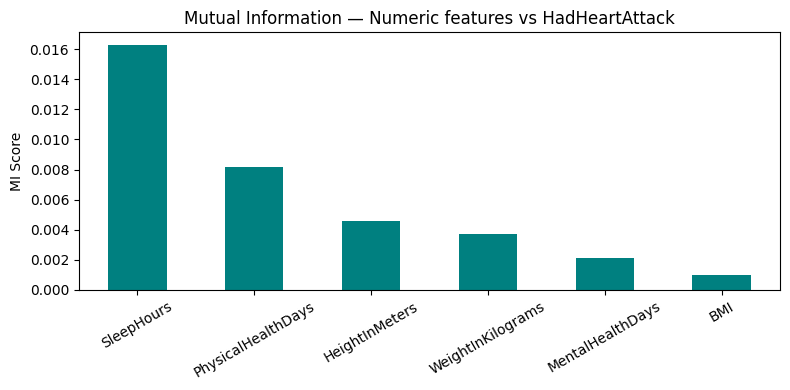

In [21]:
numeric_cols_fs = ['PhysicalHealthDays', 'MentalHealthDays', 'SleepHours',
                   'HeightInMeters', 'WeightInKilograms', 'BMI']
cat_cols_fs = [c for c in X.columns if c not in numeric_cols_fs]

mi_num = mutual_info_classif(X[numeric_cols_fs], y, random_state=42)
mi_num_scores = pd.Series(mi_num, index=numeric_cols_fs).sort_values(ascending=False)

plt.figure(figsize=(8, 4))
mi_num_scores.plot(kind='bar', color='teal')
plt.title('Mutual Information — Numeric features vs HadHeartAttack')
plt.ylabel('MI Score')
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()


#Mutual Information (categorical)

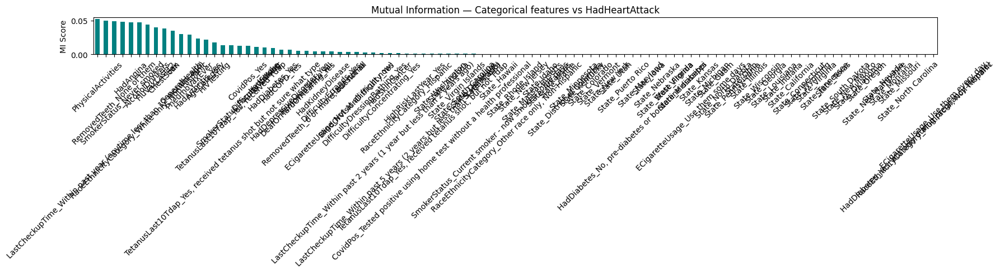

In [22]:
mi_cat = mutual_info_classif(X[cat_cols_fs], y, random_state=42)
mi_cat_scores = pd.Series(mi_cat, index=cat_cols_fs).sort_values(ascending=False)

plt.figure(figsize=(18, 5))
mi_cat_scores.plot(kind='bar', color='teal')
plt.title('Mutual Information — Categorical features vs HadHeartAttack')
plt.ylabel('MI Score')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#ANOVA F-test (numeric only)

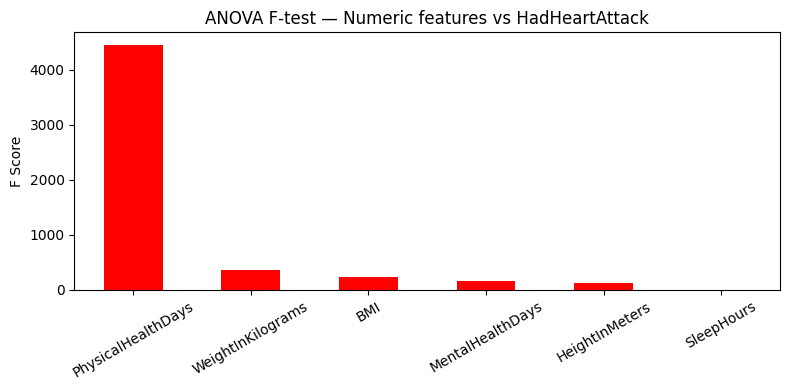

In [23]:
f_num, _ = f_classif(X[numeric_cols_fs], y)
f_scores = pd.Series(f_num, index=numeric_cols_fs).sort_values(ascending=False)

plt.figure(figsize=(8, 4))
f_scores.plot(kind='bar', color='red')
plt.title('ANOVA F-test — Numeric features vs HadHeartAttack')
plt.ylabel('F Score')
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

#Chi-square (categorical only)

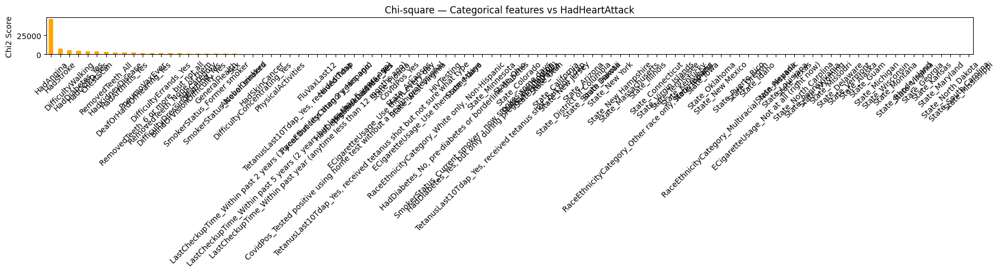

In [24]:
X_cat_scaled = MinMaxScaler().fit_transform(X[cat_cols_fs])
chi2_cat, _ = chi2(X_cat_scaled, y)
chi2_scores = pd.Series(chi2_cat, index=cat_cols_fs).sort_values(ascending=False)

plt.figure(figsize=(18, 5))
chi2_scores.plot(kind='bar', color='orange')
plt.title('Chi-square — Categorical features vs HadHeartAttack')
plt.ylabel('Chi2 Score')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [25]:
num_scores = pd.DataFrame({
    'feature': numeric_cols_fs, 'type': 'numeric',
    'MI': mi_num, 'F_ANOVA': f_num, 'Chi2': np.nan
})

cat_scores = pd.DataFrame({
    'feature': cat_cols_fs, 'type': 'categorical',
    'MI': mi_cat, 'F_ANOVA': np.nan, 'Chi2': chi2_cat
})

# Combine & normalize
all_scores = pd.concat([num_scores, cat_scores], ignore_index=True)
for col in ['MI', 'F_ANOVA', 'Chi2']:
    mn, mx = all_scores[col].min(), all_scores[col].max()
    all_scores[col + '_norm'] = (all_scores[col] - mn) / (mx - mn)

all_scores['composite'] = all_scores[
    ['MI_norm', 'F_ANOVA_norm', 'Chi2_norm']
].mean(axis=1, skipna=True)

all_scores = all_scores.sort_values('composite', ascending=False).reset_index(drop=True)
all_scores['rank'] = all_scores.index + 1

print(all_scores[['rank', 'feature', 'type', 'composite']].to_string(index=False))

# Filter
selected_features = all_scores[all_scores['composite'] >= 0.03]['feature'].tolist()
X_selected = X[selected_features]
print(f"\nFeatures kept: {len(selected_features)} / {X.shape[1]}")
print(selected_features)

 rank                                                                 feature        type    composite
    1                                                               HadAngina categorical 9.576303e-01
    2                                                      PhysicalHealthDays     numeric 5.792782e-01
    3                                                      PhysicalActivities categorical 5.041199e-01
    4                                               RemovedTeeth_None of them categorical 4.914797e-01
    5      LastCheckupTime_Within past year (anytime less than 12 months ago) categorical 4.856644e-01
    6                                               SmokerStatus_Never smoked categorical 4.773076e-01
    7                          RaceEthnicityCategory_White only, Non-Hispanic categorical 4.527362e-01
    8                                                         AlcoholDrinkers categorical 4.328311e-01
    9                                                               Chest

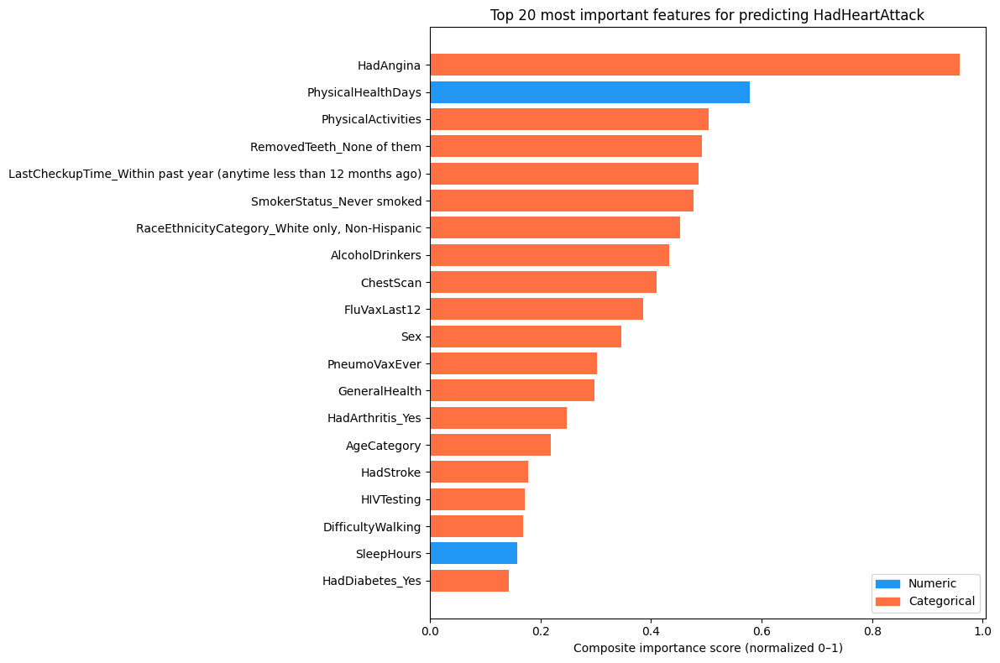


Features kept: 39 / 107
['HadAngina', 'PhysicalHealthDays', 'PhysicalActivities', 'RemovedTeeth_None of them', 'LastCheckupTime_Within past year (anytime less than 12 months ago)', 'SmokerStatus_Never smoked', 'RaceEthnicityCategory_White only, Non-Hispanic', 'AlcoholDrinkers', 'ChestScan', 'FluVaxLast12', 'Sex', 'PneumoVaxEver', 'GeneralHealth', 'HadArthritis_Yes', 'AgeCategory', 'HadStroke', 'HIVTesting', 'DifficultyWalking', 'SleepHours', 'HadDiabetes_Yes', 'SmokerStatus_Former smoker', 'TetanusLast10Tdap_Yes, received tetanus shot but not sure what type', 'TetanusLast10Tdap_Yes, received Tdap', 'CovidPos_Yes', 'HadCOPD_Yes', 'RemovedTeeth_All', 'DeafOrHardOfHearing_Yes', 'WeightInKilograms', 'HadKidneyDisease', 'HadDepressiveDisorder_Yes', 'RemovedTeeth_6 or more, but not all', 'DifficultyErrands_Yes', 'HeightInMeters', 'BlindOrVisionDifficulty_Yes', 'DifficultyDressingBathing_Yes', 'MentalHealthDays', 'ECigaretteUsage_Not at all (right now)', 'HadAsthma', 'BMI']


In [26]:
top20 = all_scores.head(20)
colors = ['#2196F3' if t == 'numeric' else '#FF7043' for t in top20['type']]

fig, ax = plt.subplots(figsize=(12, 8))
ax.barh(top20['feature'][::-1], top20['composite'][::-1], color=colors[::-1])
ax.set_xlabel('Composite importance score (normalized 0–1)')
ax.set_title('Top 20 most important features for predicting HadHeartAttack')
ax.legend(handles=[Patch(color='#2196F3', label='Numeric'),
                   Patch(color='#FF7043', label='Categorical')], loc='lower right')
plt.tight_layout()
plt.show()

# Filter to selected features
selected_features = all_scores[all_scores['composite'] >= 0.03]['feature'].tolist()
X_selected = X[selected_features]
print(f"\nFeatures kept: {len(selected_features)} / {X.shape[1]}")
print(selected_features)

#Train Random Forest

In [27]:
X_train, X_test, y_train, y_test = train_test_split(
    X_selected, y, test_size=0.20, random_state=42, stratify=y)

print("Train class distribution:")
print(y_train.value_counts(normalize=True).round(3))

rf_model = RandomForestClassifier(
    n_estimators=300,
    class_weight='balanced',
    random_state=42,
    n_jobs=-1,
    max_features='sqrt'
)
rf_model.fit(X_train, y_train)
print("Training complete.")

Train class distribution:
HadHeartAttack
0    0.945
1    0.055
Name: proportion, dtype: float64
Training complete.


#Evaluation: classification report & confusion matrix

Classification Report:
                  precision    recall  f1-score   support

 No Heart Attack       0.95      1.00      0.97     46518
Had Heart Attack       0.61      0.12      0.20      2687

        accuracy                           0.95     49205
       macro avg       0.78      0.56      0.59     49205
    weighted avg       0.93      0.95      0.93     49205



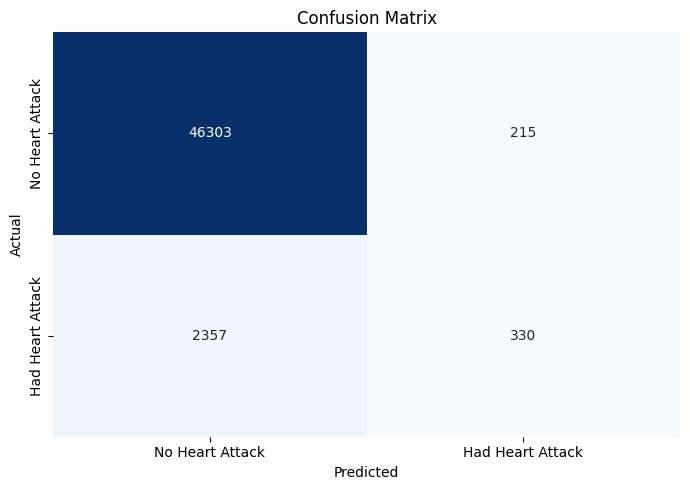

In [28]:
y_pred  = rf_model.predict(X_test)
y_proba = rf_model.predict_proba(X_test)[:, 1]

print("Classification Report:")
print(classification_report(y_test, y_pred,
                            target_names=['No Heart Attack', 'Had Heart Attack']))

plt.figure(figsize=(7, 5))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d',
            cmap='Blues', cbar=False,
            xticklabels=['No Heart Attack', 'Had Heart Attack'],
            yticklabels=['No Heart Attack', 'Had Heart Attack'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.tight_layout()
plt.show()

#Evaluation: ROC & Precision-Recall curves

ROC-AUC Score : 0.8778
PR-AUC Score  : 0.3920


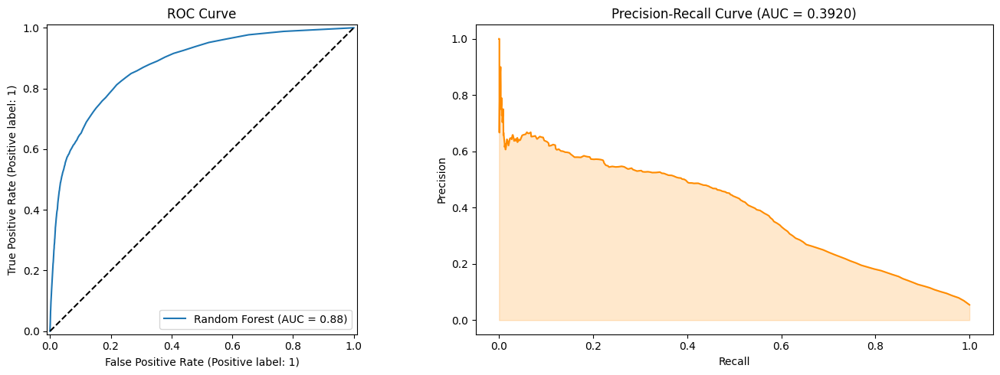

In [29]:
print(f"ROC-AUC Score : {roc_auc_score(y_test, y_proba):.4f}")

precision, recall, _ = precision_recall_curve(y_test, y_proba)
pr_auc = auc(recall, precision)
print(f"PR-AUC Score  : {pr_auc:.4f}")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

RocCurveDisplay.from_predictions(y_test, y_proba, ax=axes[0], name='Random Forest')
axes[0].plot([0, 1], [0, 1], 'k--')
axes[0].set_title('ROC Curve')

axes[1].plot(recall, precision, color='darkorange')
axes[1].set_xlabel('Recall')
axes[1].set_ylabel('Precision')
axes[1].set_title(f'Precision-Recall Curve (AUC = {pr_auc:.4f})')
axes[1].fill_between(recall, precision, alpha=0.2, color='darkorange')

plt.tight_layout()
plt.show()

#Random Forest feature importance

Top 15 Most Important Features:
                  feature  importance
                HadAngina     0.17254
              AgeCategory     0.09357
                      BMI     0.07139
        WeightInKilograms     0.06473
                ChestScan     0.05334
            GeneralHealth     0.05193
           HeightInMeters     0.05127
               SleepHours     0.03702
       PhysicalHealthDays     0.03370
         MentalHealthDays     0.02527
        DifficultyWalking     0.02319
                HadStroke     0.02201
RemovedTeeth_None of them     0.02070
          HadDiabetes_Yes     0.02037
            PneumoVaxEver     0.01977


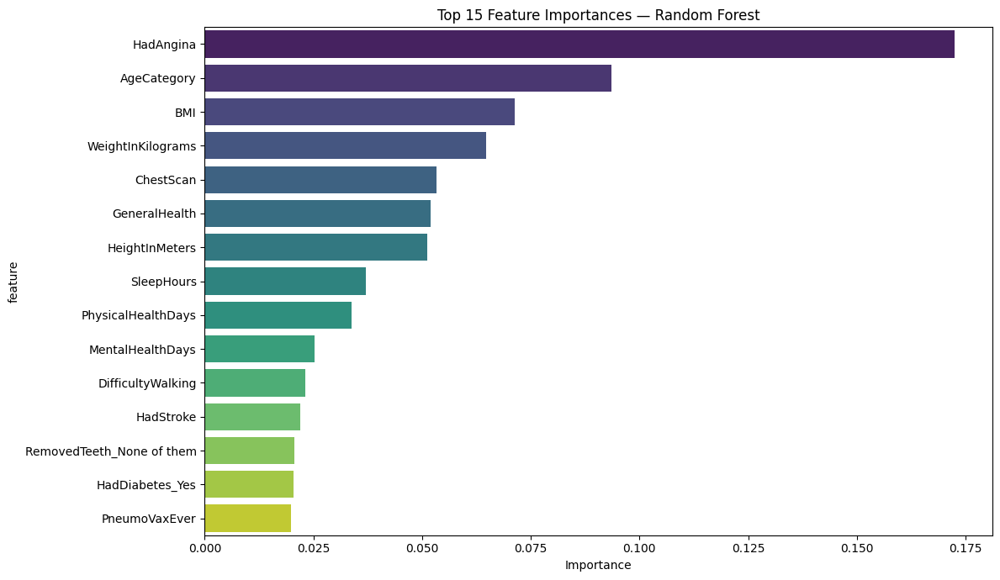

In [30]:
feature_importance = pd.DataFrame({
    'feature'   : X_selected.columns,
    'importance': rf_model.feature_importances_
}).sort_values('importance', ascending=False)

print("Top 15 Most Important Features:")
print(feature_importance.head(15).round(5).to_string(index=False))

plt.figure(figsize=(12, 7))
sns.barplot(data=feature_importance.head(15),
            x='importance', y='feature', palette='viridis')
plt.title('Top 15 Feature Importances — Random Forest')
plt.xlabel('Importance')
plt.tight_layout()
plt.show()

 99%|===================| 198/200 [02:01<00:01]       

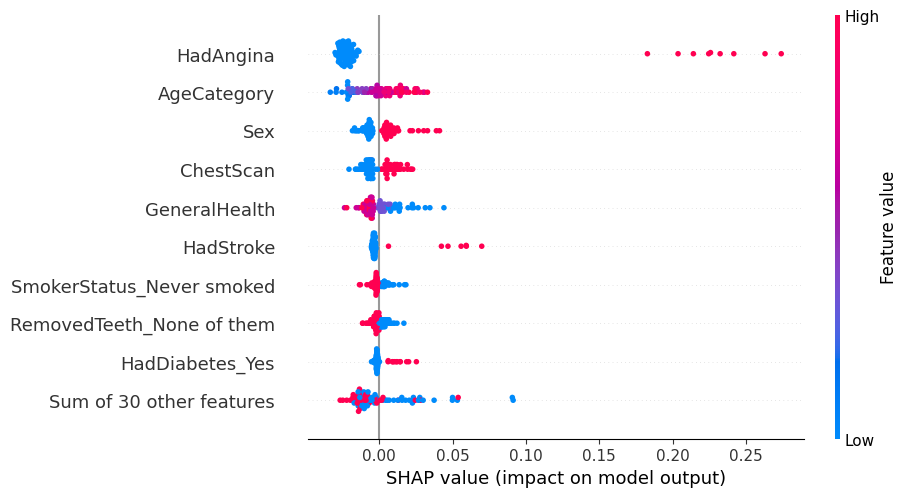

In [31]:
import shap
# Sample first to avoid long runtime
X_shap = X_test.sample(100, random_state=42)

# Convert all columns to float64 to ensure compatibility with SHAP explainer
X_shap = X_shap.astype(float)

# Generic explainer — auto detects tree model
explainer = shap.Explainer(rf_model, X_shap)
shap_values = explainer(X_shap)

# Beeswarm for class 1 (Had Heart Attack)
shap.plots.beeswarm(shap_values[:, :, 1])

In [32]:
!pip install lime
import lime
import lime.lime_tabular

lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data= X_train.values,
    feature_names=X_train.columns.tolist(),
    class_names=['No Heart Attack', 'Heart Attack'],
    mode='classification'
)

i = 0

exp = lime_explainer.explain_instance(
    data_row=X_test.iloc[i].values,
    predict_fn=rf_model.predict_proba
)

exp.show_in_notebook(show_table=True)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 9.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=e852bcea259217f5b88c2d3c0c2b272969b05f8bdbcf7daecc91b220276ec9a9
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


#PDP for Random Forest

PDP features (RF): ['AgeCategory', 'BMI', 'WeightInKilograms', 'GeneralHealth', 'HeightInMeters', 'SleepHours']


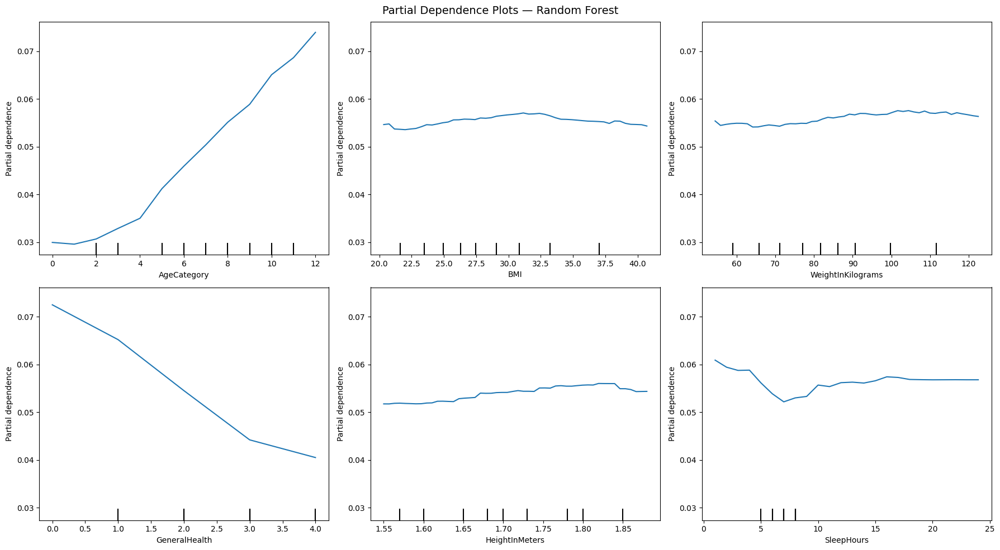

In [79]:

from sklearn.inspection import PartialDependenceDisplay

# Filter to continuous/ordinal only (binary cols break PDP)
binary_like_rf = [c for c in X_train.columns if X_train[c].nunique() <= 2]
pdp_features_rf = [
    f for f in feature_importance['feature'].tolist()
    if f not in binary_like_rf
][:6]
print("PDP features (RF):", pdp_features_rf)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
PartialDependenceDisplay.from_estimator(
    rf_model,
    X_train,
    features=pdp_features_rf,
    kind='average',
    ax=axes.flatten(),
    grid_resolution=50,
    random_state=42
)
plt.suptitle('Partial Dependence Plots — Random Forest', fontsize=14)
plt.tight_layout()
plt.show()

#CE + PDP for Random Forest

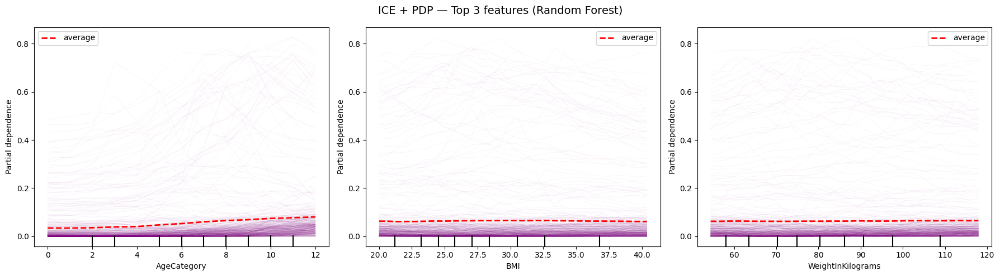

In [80]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
PartialDependenceDisplay.from_estimator(
    rf_model,
    X_train.sample(500, random_state=42),
    features=pdp_features_rf[:3],
    kind='both',
    ax=axes,
    grid_resolution=30,
    random_state=42,
    ice_lines_kw={'alpha': 0.05, 'color': 'purple'},
    pd_line_kw={'color': 'red', 'linewidth': 2}
)
plt.suptitle('ICE + PDP — Top 3 features (Random Forest)', fontsize=14)
plt.tight_layout()
plt.show()

#2-D PDP Interaction for Random Forest

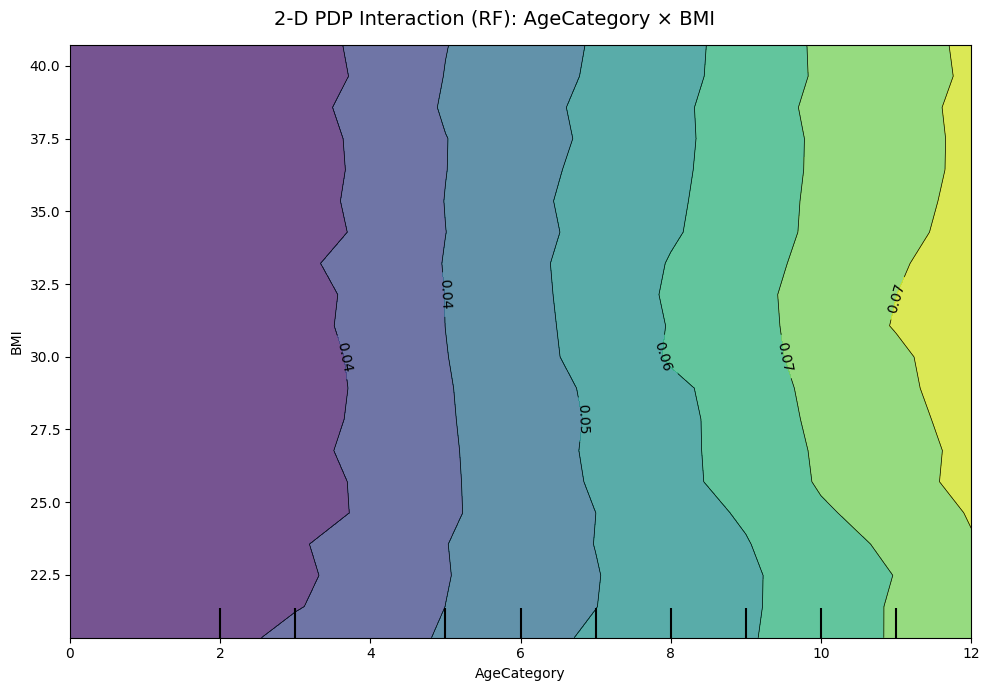

In [81]:
interact_features_rf = [(pdp_features_rf[0], pdp_features_rf[1])]

fig, ax = plt.subplots(figsize=(10, 7))
PartialDependenceDisplay.from_estimator(
    rf_model,
    X_train,
    features=interact_features_rf,
    kind='average',
    ax=[ax],
    grid_resolution=20,
    random_state=42
)
plt.suptitle(f'2-D PDP Interaction (RF): {pdp_features_rf[0]} × {pdp_features_rf[1]}',
             fontsize=14)
plt.tight_layout()
plt.show()

#LOFO for Random Forest

In [82]:
from sklearn.ensemble import RandomForestClassifier

baseline_auc_rf = roc_auc_score(y_test, y_proba)
print(f'Baseline ROC-AUC (RF): {baseline_auc_rf:.4f}')

lofo_rf_records = []

for feat in X_train.columns:
    X_tr_lo = X_train.drop(columns=[feat])
    X_te_lo = X_test.drop(columns=[feat])

    rf_lo = RandomForestClassifier(
        n_estimators=100,
        class_weight='balanced',
        random_state=42,
        n_jobs=-1,
        max_features='sqrt'
    )
    rf_lo.fit(X_tr_lo, y_train)
    auc_lo = roc_auc_score(y_test, rf_lo.predict_proba(X_te_lo)[:, 1])
    lofo_rf_records.append({
        'feature'    : feat,
        'auc_without': auc_lo,
        'importance' : baseline_auc_rf - auc_lo
    })

lofo_rf_df = (pd.DataFrame(lofo_rf_records)
                .sort_values('importance', ascending=False)
                .reset_index(drop=True))
lofo_rf_df['rank'] = lofo_rf_df.index + 1
print('\nLOFO Results — Random Forest (top 20):')
print(lofo_rf_df.head(20).round(5).to_string(index=False))

Baseline ROC-AUC (RF): 0.8778

LOFO Results — Random Forest (top 20):
                                       feature  auc_without  importance  rank
                                     HadAngina      0.82310     0.05468     1
                                   AgeCategory      0.86070     0.01708     2
                                     ChestScan      0.86180     0.01597     3
                                    SleepHours      0.86523     0.01254     4
                                    HIVTesting      0.86576     0.01202     5
                                           Sex      0.86582     0.01195     6
                              RemovedTeeth_All      0.86644     0.01134     7
                                     HadStroke      0.86691     0.01086     8
                               AlcoholDrinkers      0.86700     0.01078     9
                     SmokerStatus_Never smoked      0.86745     0.01033    10
                                 GeneralHealth      0.86771     0.01007 

#LOFO Bar Chart for Random Forest

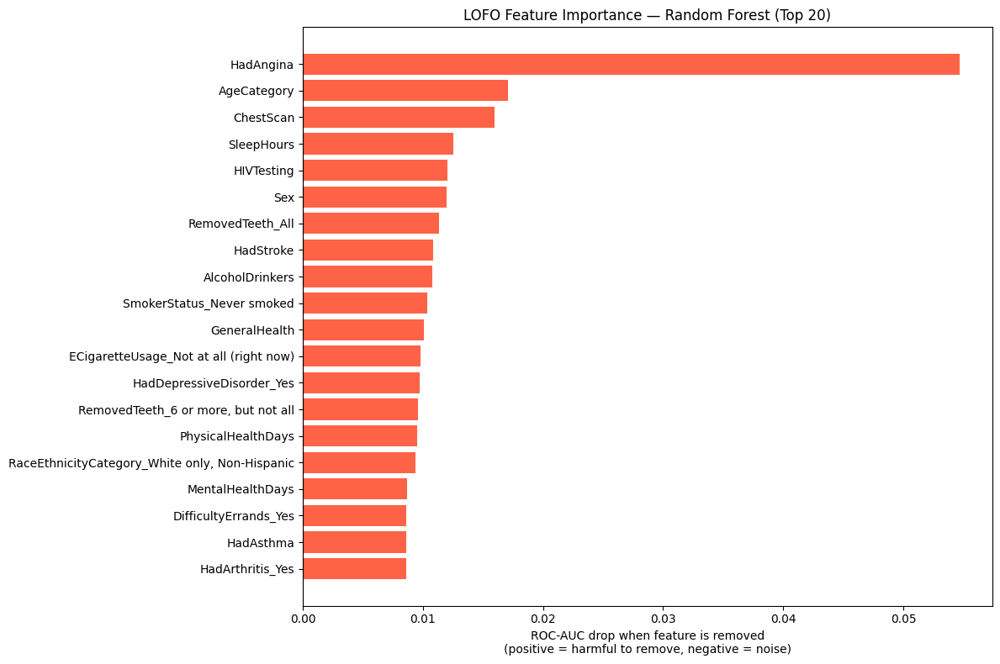

In [83]:
top_lofo_rf = lofo_rf_df.head(20)
colors_lofo_rf = ['tomato' if v > 0 else 'steelblue'
                  for v in top_lofo_rf['importance']]

plt.figure(figsize=(12, 8))
plt.barh(top_lofo_rf['feature'][::-1],
         top_lofo_rf['importance'][::-1],
         color=colors_lofo_rf[::-1])
plt.axvline(0, color='black', linewidth=0.8)
plt.xlabel('ROC-AUC drop when feature is removed\n'
           '(positive = harmful to remove, negative = noise)')
plt.title('LOFO Feature Importance — Random Forest (Top 20)')
plt.tight_layout()
plt.show()

# Logistic Regression

In [33]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import (classification_report, confusion_matrix,
                             roc_auc_score, RocCurveDisplay,
                             precision_recall_curve, auc)
from sklearn.inspection import PartialDependenceDisplay
import shap, lime, lime.lime_tabular
import warnings
warnings.filterwarnings('ignore')


## Train Logistic Regression (same selected features as RF)

In [34]:
# Re-use X_selected / X_train / X_test / y_train / y_test from the RF section
# LR needs scaled input → wrap in a Pipeline
lr_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('lr', LogisticRegression(
        max_iter=1000,
        class_weight='balanced',
        solver='lbfgs',
        random_state=42,
        n_jobs=-1
    ))
])

lr_pipeline.fit(X_train, y_train)
print('Logistic Regression training complete.')


Logistic Regression training complete.


## Evaluation: Classification Report & Confusion Matrix

Classification Report — Logistic Regression:
                  precision    recall  f1-score   support

 No Heart Attack       0.98      0.84      0.90     46518
Had Heart Attack       0.21      0.77      0.33      2687

        accuracy                           0.83     49205
       macro avg       0.60      0.80      0.62     49205
    weighted avg       0.94      0.83      0.87     49205



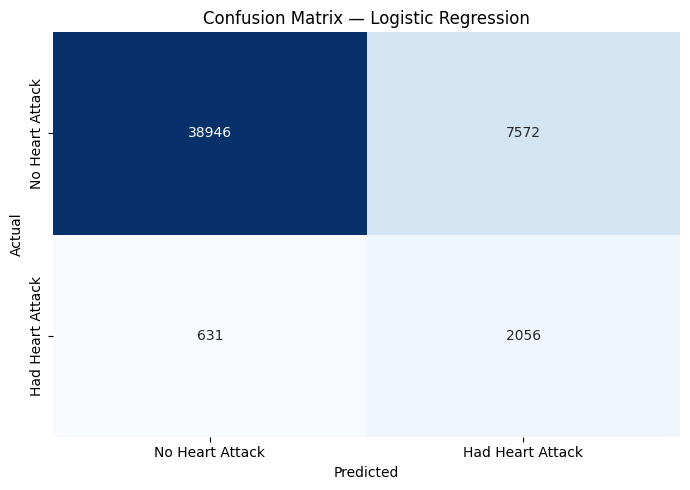

In [35]:
y_pred_lr  = lr_pipeline.predict(X_test)
y_proba_lr = lr_pipeline.predict_proba(X_test)[:, 1]

print('Classification Report — Logistic Regression:')
print(classification_report(y_test, y_pred_lr,
                             target_names=['No Heart Attack', 'Had Heart Attack']))

plt.figure(figsize=(7, 5))
sns.heatmap(confusion_matrix(y_test, y_pred_lr), annot=True, fmt='d',
            cmap='Blues', cbar=False,
            xticklabels=['No Heart Attack', 'Had Heart Attack'],
            yticklabels=['No Heart Attack', 'Had Heart Attack'])
plt.title('Confusion Matrix — Logistic Regression')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.tight_layout()
plt.show()


## Evaluation: ROC & Precision-Recall Curves

ROC-AUC Score : 0.8856
PR-AUC Score  : 0.4018


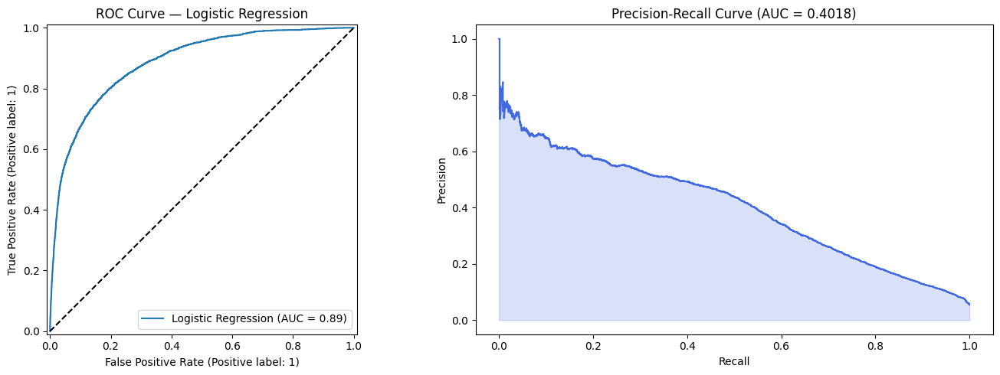

In [36]:
print(f'ROC-AUC Score : {roc_auc_score(y_test, y_proba_lr):.4f}')

precision_lr, recall_lr, _ = precision_recall_curve(y_test, y_proba_lr)
pr_auc_lr = auc(recall_lr, precision_lr)
print(f'PR-AUC Score  : {pr_auc_lr:.4f}')

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

RocCurveDisplay.from_predictions(y_test, y_proba_lr, ax=axes[0], name='Logistic Regression')
axes[0].plot([0, 1], [0, 1], 'k--')
axes[0].set_title('ROC Curve — Logistic Regression')

axes[1].plot(recall_lr, precision_lr, color='royalblue')
axes[1].fill_between(recall_lr, precision_lr, alpha=0.2, color='royalblue')
axes[1].set_xlabel('Recall')
axes[1].set_ylabel('Precision')
axes[1].set_title(f'Precision-Recall Curve (AUC = {pr_auc_lr:.4f})')

plt.tight_layout()
plt.show()


## Logistic Regression Coefficients (Feature Importance)

Top 15 features by absolute coefficient:
                                                           feature  coefficient
                                                       AgeCategory       0.6757
                                                         HadAngina       0.6212
                                                               Sex       0.3601
                                                         ChestScan       0.3292
                                                     GeneralHealth      -0.3047
                                         SmokerStatus_Never smoked      -0.2394
                                                         HadStroke       0.2108
                                                   HadDiabetes_Yes       0.1261
                                        SmokerStatus_Former smoker      -0.1168
                                                   AlcoholDrinkers      -0.1095
LastCheckupTime_Within past year (anytime less than 12 months ago)       0.1049

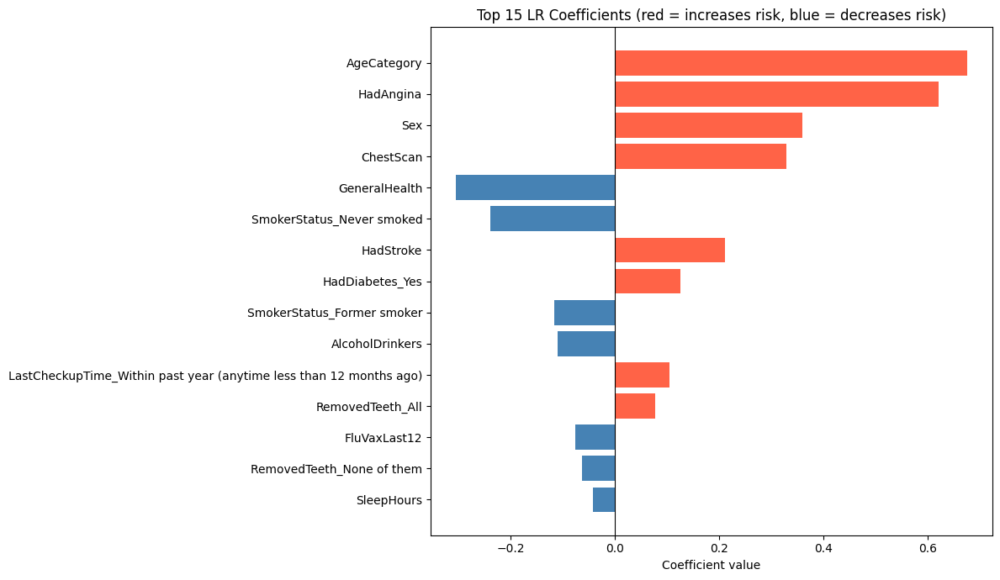

In [37]:
lr_coef = pd.DataFrame({
    'feature'    : X_train.columns,
    'coefficient': lr_pipeline.named_steps['lr'].coef_[0]
}).sort_values('coefficient', key=abs, ascending=False)

print('Top 15 features by absolute coefficient:')
print(lr_coef.head(15).round(4).to_string(index=False))

top15_coef = lr_coef.head(15)
colors = ['tomato' if c > 0 else 'steelblue' for c in top15_coef['coefficient']]

plt.figure(figsize=(12, 7))
plt.barh(top15_coef['feature'][::-1], top15_coef['coefficient'][::-1], color=colors[::-1])
plt.axvline(0, color='black', linewidth=0.8)
plt.xlabel('Coefficient value')
plt.title('Top 15 LR Coefficients (red = increases risk, blue = decreases risk)')
plt.tight_layout()
plt.show()


## Model Comparison: Random Forest vs Logistic Regression

                     ROC-AUC  PR-AUC  F1 (HA)  Recall (HA)  Precision (HA)
Model                                                                     
Random Forest         0.8778  0.3920   0.2042       0.1228          0.6055
Logistic Regression   0.8856  0.4018   0.3339       0.7652          0.2135


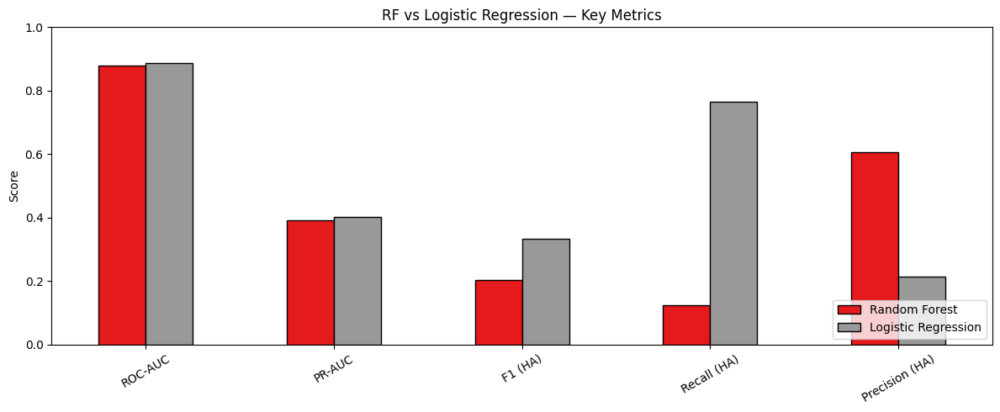

In [38]:
from sklearn.metrics import f1_score, precision_score, recall_score

metrics = {
    'Model'    : ['Random Forest', 'Logistic Regression'],
    'ROC-AUC'  : [roc_auc_score(y_test, y_proba),    roc_auc_score(y_test, y_proba_lr)],
    'PR-AUC'   : [pr_auc,                            pr_auc_lr],
    'F1 (HA)'  : [f1_score(y_test, y_pred,  pos_label=1),
                  f1_score(y_test, y_pred_lr, pos_label=1)],
    'Recall (HA)': [recall_score(y_test, y_pred,  pos_label=1),
                    recall_score(y_test, y_pred_lr, pos_label=1)],
    'Precision (HA)': [precision_score(y_test, y_pred,  pos_label=1),
                       precision_score(y_test, y_pred_lr, pos_label=1)],
}

comparison_df = pd.DataFrame(metrics).set_index('Model').round(4)
print(comparison_df.to_string())

comparison_df.T.plot(kind='bar', figsize=(12, 5), colormap='Set1', edgecolor='black')
plt.title('RF vs Logistic Regression — Key Metrics')
plt.ylabel('Score')
plt.xticks(rotation=30)
plt.ylim(0, 1)
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


# Explainability — Logistic Regression
## SHAP: Beeswarm Plot

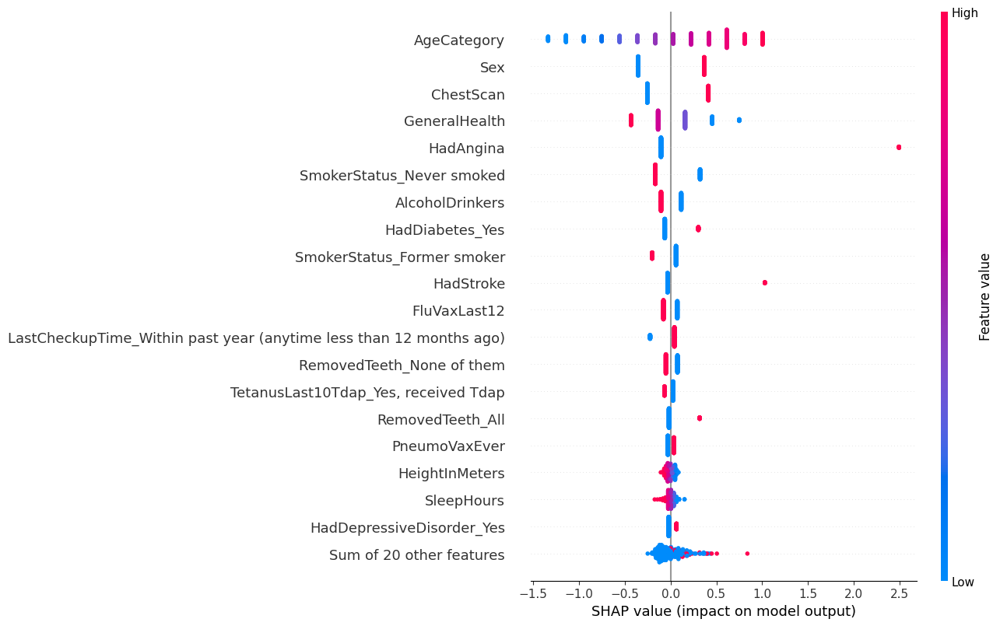

In [39]:
# Scale the sample the same way the pipeline would
scaler_lr = lr_pipeline.named_steps['scaler']
lr_model  = lr_pipeline.named_steps['lr']

X_shap_lr_raw = X_test.sample(300, random_state=42)
X_shap_lr_scaled = pd.DataFrame(
    scaler_lr.transform(X_shap_lr_raw),
    columns=X_shap_lr_raw.columns
)

explainer_lr = shap.LinearExplainer(lr_model, X_shap_lr_scaled)
shap_values_lr = explainer_lr(X_shap_lr_scaled)

shap.plots.beeswarm(shap_values_lr, max_display=20)


## SHAP: Bar Summary (Mean |SHAP|)

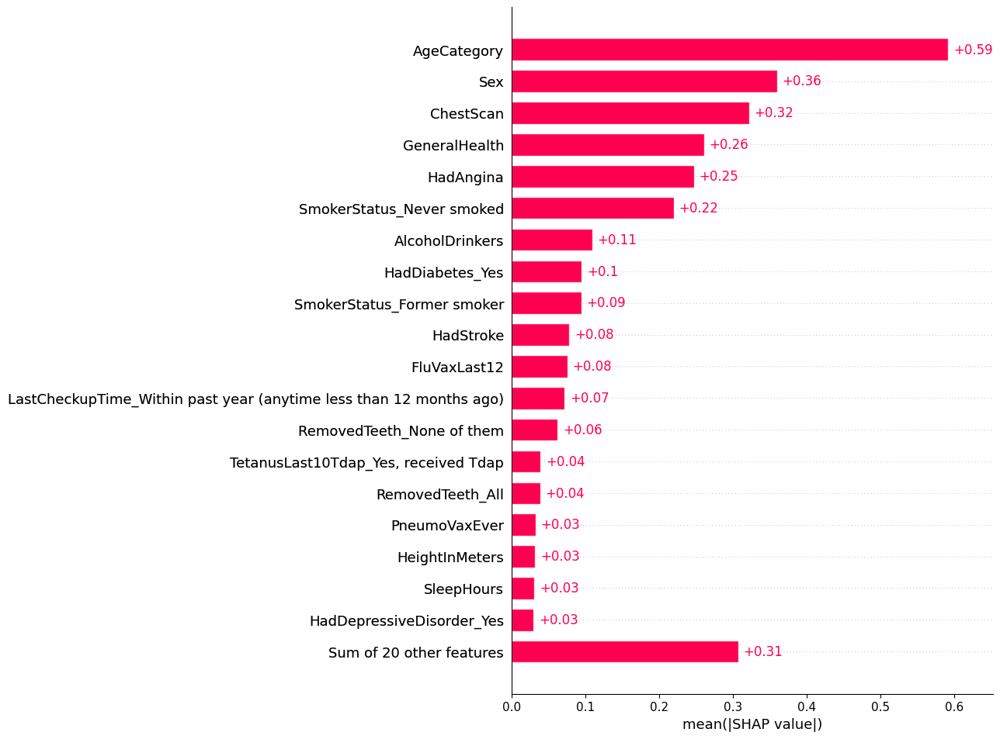

In [40]:
shap.plots.bar(shap_values_lr, max_display=20)


## SHAP: Waterfall Plot — Single Instance

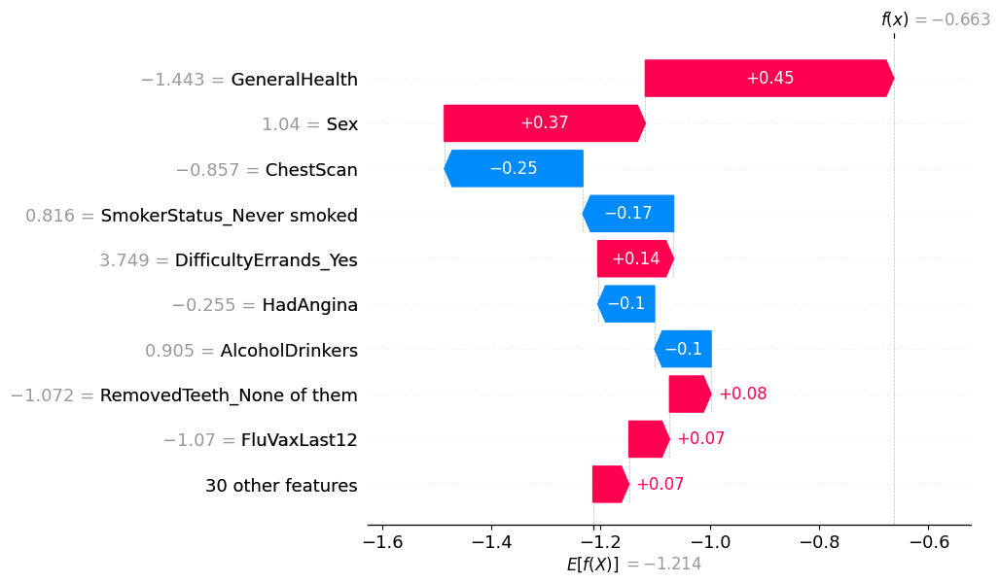

In [41]:
# Waterfall for the first sample — shows how features push the prediction
shap.plots.waterfall(shap_values_lr[0])


## LIME: Local Explanation — Logistic Regression

In [42]:
lime_explainer_lr = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns.tolist(),
    class_names=['No Heart Attack', 'Heart Attack'],
    mode='classification'
)

# Explain a positive (heart-attack) instance if available
pos_indices = y_test[y_test == 1].index
sample_idx  = X_test.index.get_loc(pos_indices[0])

exp_lr = lime_explainer_lr.explain_instance(
    data_row=X_test.iloc[sample_idx].values,
    predict_fn=lr_pipeline.predict_proba
)

exp_lr.show_in_notebook(show_table=True)


## LIME: Top Features Bar Chart (LR)

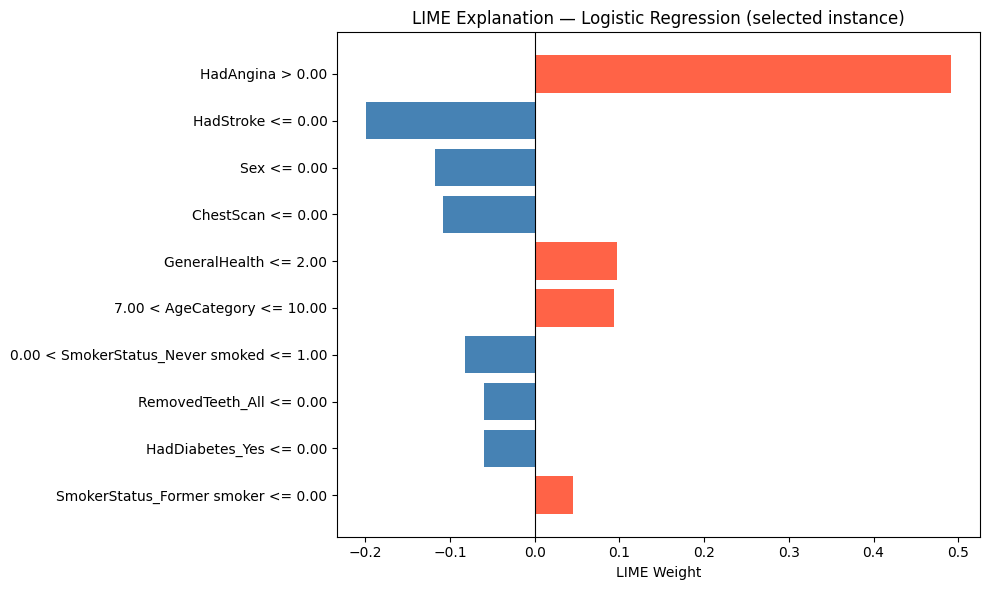

In [43]:
lime_features_lr = exp_lr.as_list()
lime_df_lr = pd.DataFrame(lime_features_lr, columns=['Feature', 'Weight'])
lime_df_lr = lime_df_lr.sort_values('Weight', key=abs, ascending=False)

colors_lime = ['tomato' if w > 0 else 'steelblue' for w in lime_df_lr['Weight']]

plt.figure(figsize=(10, 6))
plt.barh(lime_df_lr['Feature'][::-1], lime_df_lr['Weight'][::-1], color=colors_lime[::-1])
plt.axvline(0, color='black', linewidth=0.8)
plt.title('LIME Explanation — Logistic Regression (selected instance)')
plt.xlabel('LIME Weight')
plt.tight_layout()
plt.show()


## Partial Dependence Plots (PDP) — Logistic Regression

PDP features: ['AgeCategory', 'GeneralHealth', 'SleepHours', 'HeightInMeters', 'BMI', 'PhysicalHealthDays']


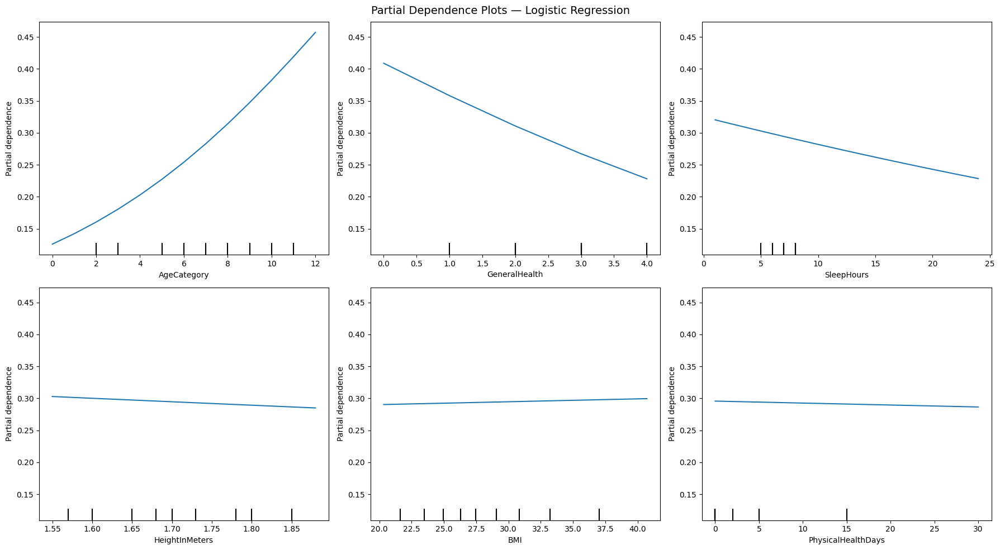

In [45]:
# Filter to continuous/ordinal features only (binary cols break PDP)
binary_like = [c for c in X_train.columns if X_train[c].nunique() <= 2]
pdp_features = [f for f in lr_coef['feature'].tolist() if f not in binary_like][:6]
print("PDP features:", pdp_features)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
PartialDependenceDisplay.from_estimator(
    lr_pipeline,
    X_train,
    features=pdp_features,
    kind='average',
    ax=axes.flatten(),
    grid_resolution=50,
    random_state=42
)
plt.suptitle('Partial Dependence Plots — Logistic Regression', fontsize=14)
plt.tight_layout()
plt.show()

## Individual Conditional Expectation (ICE) Plots — LR

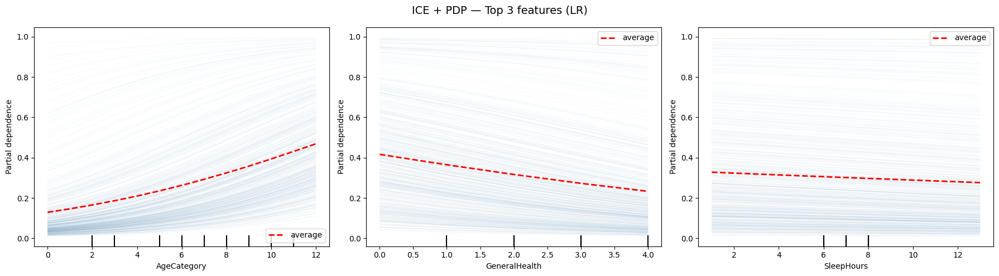

In [46]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
PartialDependenceDisplay.from_estimator(
    lr_pipeline,
    X_train.sample(500, random_state=42),
    features=pdp_features[:3],   # uses the filtered list from cell 82
    kind='both',
    ax=axes,
    grid_resolution=30,
    random_state=42,
    ice_lines_kw={'alpha': 0.05, 'color': 'steelblue'},
    pd_line_kw={'color': 'red', 'linewidth': 2}
)
plt.suptitle('ICE + PDP — Top 3 features (LR)', fontsize=14)
plt.tight_layout()
plt.show()

## 2-D Interaction PDP — BMI × AgeCategory

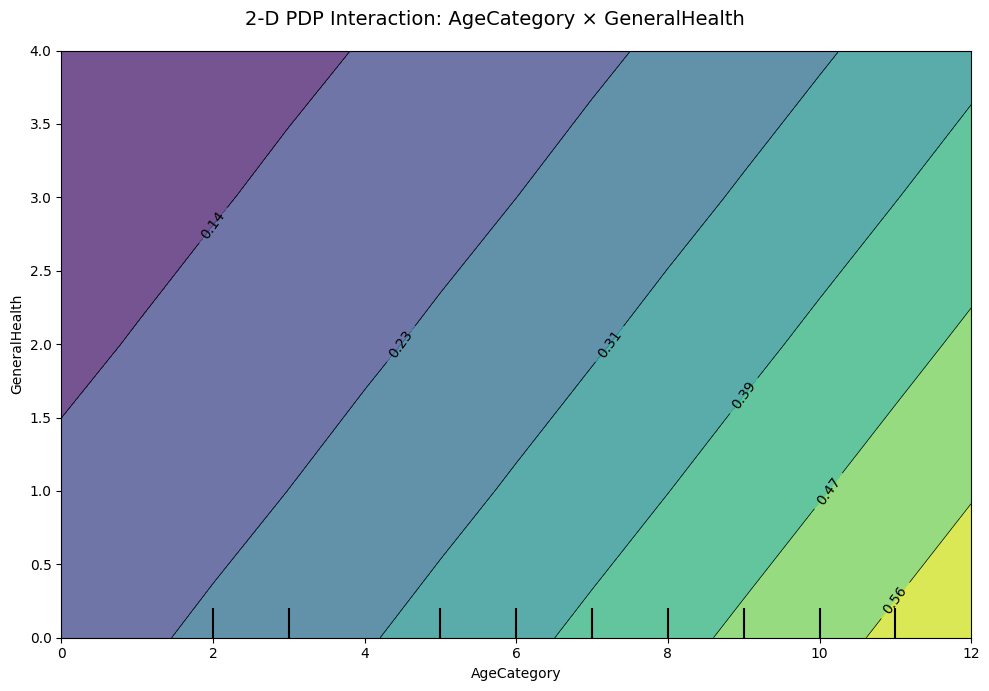

In [47]:
# Pick first two continuous features for the interaction plot
interact_features = [(pdp_features[0], pdp_features[1])]

fig, ax = plt.subplots(figsize=(10, 7))
PartialDependenceDisplay.from_estimator(
    lr_pipeline,
    X_train,
    features=interact_features,
    kind='average',
    ax=[ax],
    grid_resolution=20,
    random_state=42
)
plt.suptitle(f'2-D PDP Interaction: {pdp_features[0]} × {pdp_features[1]}', fontsize=14)
plt.tight_layout()
plt.show()

## LOFO — Leave One Feature Out Importance (ROC-AUC, Logistic Regression)

In [48]:
from copy import deepcopy

baseline_auc = roc_auc_score(y_test, y_proba_lr)
print(f'Baseline ROC-AUC: {baseline_auc:.4f}')

lofo_records = []

for feat in X_train.columns:
    cols_drop = [feat]
    X_tr_lo   = X_train.drop(columns=cols_drop)
    X_te_lo   = X_test.drop(columns=cols_drop)

    lr_lo = Pipeline([
        ('scaler', StandardScaler()),
        ('lr', LogisticRegression(
            max_iter=1000, class_weight='balanced',
            solver='lbfgs', random_state=42, n_jobs=-1
        ))
    ])
    lr_lo.fit(X_tr_lo, y_train)
    auc_lo = roc_auc_score(y_test, lr_lo.predict_proba(X_te_lo)[:, 1])
    lofo_records.append({'feature': feat, 'auc_without': auc_lo,
                         'importance': baseline_auc - auc_lo})

lofo_df = pd.DataFrame(lofo_records).sort_values('importance', ascending=False).reset_index(drop=True)
lofo_df['rank'] = lofo_df.index + 1
print('\nLOFO Results (top 20):')
print(lofo_df.head(20).round(5).to_string(index=False))


Baseline ROC-AUC: 0.8856

LOFO Results (top 20):
                                                           feature  auc_without  importance  rank
                                                         HadAngina      0.84275     0.04289     1
                                                       AgeCategory      0.87923     0.00641     2
                                                         ChestScan      0.87973     0.00590     3
                                                     GeneralHealth      0.88289     0.00274     4
                                                         HadStroke      0.88296     0.00267     5
                                                               Sex      0.88404     0.00159     6
                                                   HadDiabetes_Yes      0.88502     0.00061     7
                                         SmokerStatus_Never smoked      0.88513     0.00051     8
LastCheckupTime_Within past year (anytime less than 12 months ago)   

## LOFO: Importance Bar Chart

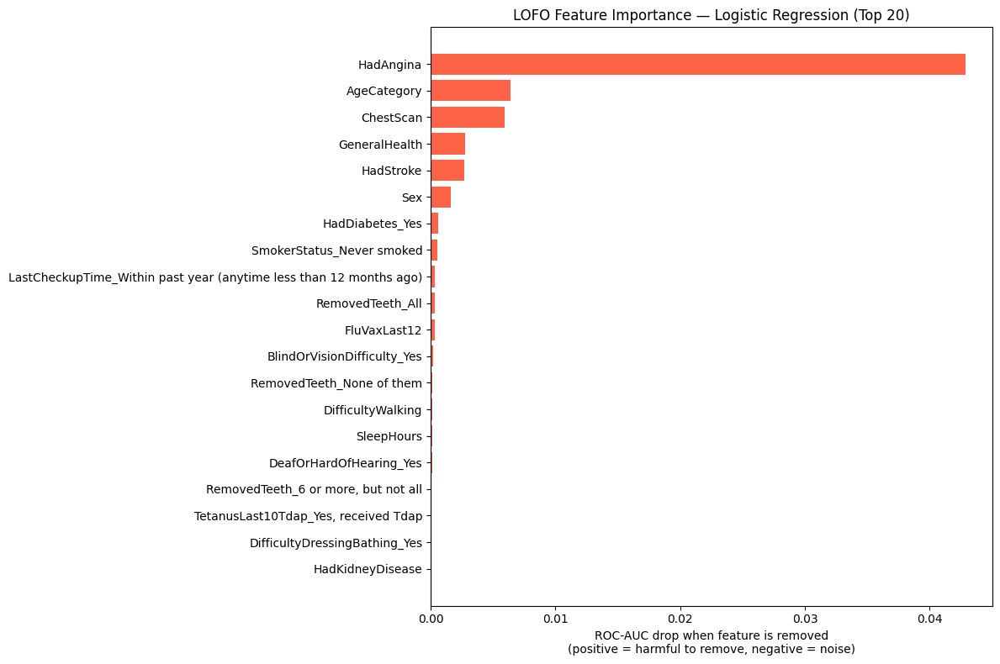

In [49]:
top_lofo = lofo_df.head(20)
colors_lofo = ['tomato' if v > 0 else 'steelblue' for v in top_lofo['importance']]

plt.figure(figsize=(12, 8))
plt.barh(top_lofo['feature'][::-1], top_lofo['importance'][::-1], color=colors_lofo[::-1])
plt.axvline(0, color='black', linewidth=0.8)
plt.xlabel('ROC-AUC drop when feature is removed\n(positive = harmful to remove, negative = noise)')
plt.title('LOFO Feature Importance — Logistic Regression (Top 20)')
plt.tight_layout()
plt.show()


## LOFO: Noisy / Redundant Features (AUC improves without them)

In [50]:
noisy = lofo_df[lofo_df['importance'] < 0].sort_values('importance')
if len(noisy):
    print(f'Features whose removal IMPROVES AUC ({len(noisy)} total):')
    print(noisy.round(5).to_string(index=False))
else:
    print('No features found that hurt the model — all contribute positively.')


Features whose removal IMPROVES AUC (9 total):
                                                            feature  auc_without  importance  rank
                                                    AlcoholDrinkers      0.88574    -0.00011    39
                     RaceEthnicityCategory_White only, Non-Hispanic      0.88571    -0.00008    38
                                          HadDepressiveDisorder_Yes      0.88570    -0.00007    37
                             ECigaretteUsage_Not at all (right now)      0.88569    -0.00006    36
                                                 PhysicalActivities      0.88568    -0.00005    35
TetanusLast10Tdap_Yes, received tetanus shot but not sure what type      0.88568    -0.00005    34
                                                     HeightInMeters      0.88564    -0.00001    33
                                                       CovidPos_Yes      0.88564    -0.00000    32
                                                  WeightInKilo

# CART — Classification and Regression Tree (max_depth=5)

In [51]:
from sklearn.tree import DecisionTreeClassifier, export_text, plot_tree
from sklearn.metrics import (classification_report, confusion_matrix,
                             roc_auc_score, RocCurveDisplay,
                             precision_recall_curve, auc, f1_score,
                             precision_score, recall_score)
from sklearn.inspection import PartialDependenceDisplay
import shap, lime, lime.lime_tabular
import warnings
warnings.filterwarnings('ignore')


## Train CART (max_depth=5, class_weight='balanced')

In [52]:
# Same X_train / X_test / y_train / y_test as RF and LR
cart_model = DecisionTreeClassifier(
    max_depth=5,
    class_weight='balanced',
    criterion='gini',
    random_state=42
)
cart_model.fit(X_train, y_train)
print('CART training complete.')
print(f'Tree depth  : {cart_model.get_depth()}')
print(f'Tree leaves : {cart_model.get_n_leaves()}')


CART training complete.
Tree depth  : 5
Tree leaves : 30


## Decision Rules (Text)

In [53]:
rules = export_text(cart_model, feature_names=list(X_train.columns), max_depth=5)
print(rules)


|--- HadAngina <= 0.50
|   |--- ChestScan <= 0.50
|   |   |--- AgeCategory <= 7.50
|   |   |   |--- DifficultyWalking <= 0.50
|   |   |   |   |--- HadStroke <= 0.50
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- HadStroke >  0.50
|   |   |   |   |   |--- class: 1
|   |   |   |--- DifficultyWalking >  0.50
|   |   |   |   |--- SmokerStatus_Never smoked <= 0.50
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- SmokerStatus_Never smoked >  0.50
|   |   |   |   |   |--- class: 0
|   |   |--- AgeCategory >  7.50
|   |   |   |--- GeneralHealth <= 2.50
|   |   |   |   |--- GeneralHealth <= 1.50
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- GeneralHealth >  1.50
|   |   |   |   |   |--- class: 0
|   |   |   |--- GeneralHealth >  2.50
|   |   |   |   |--- HadStroke <= 0.50
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- HadStroke >  0.50
|   |   |   |   |   |--- class: 1
|   |--- ChestScan >  0.50
|   |   |--- HadStroke <= 0.50
|   |   |   |--- AgeCategory <= 5.50
|

## Tree Visualization

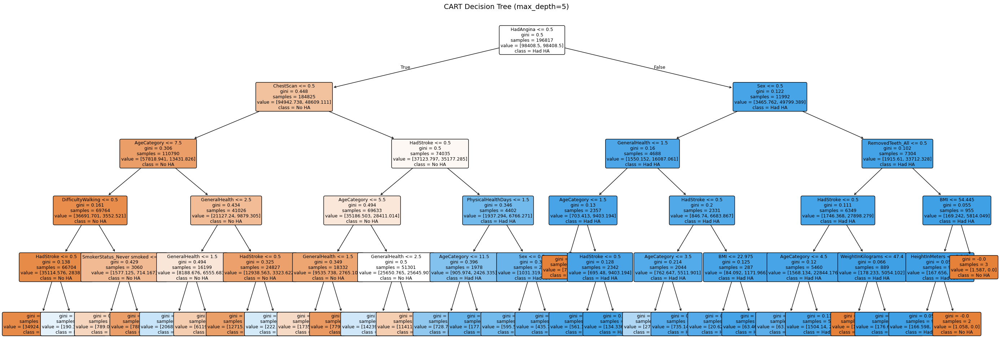

In [54]:
fig, ax = plt.subplots(figsize=(28, 10))
plot_tree(
    cart_model,
    feature_names=X_train.columns.tolist(),
    class_names=['No HA', 'Had HA'],
    filled=True,
    rounded=True,
    fontsize=9,
    ax=ax
)
plt.title('CART Decision Tree (max_depth=5)', fontsize=14)
plt.tight_layout()
plt.show()


## Evaluation: Classification Report & Confusion Matrix

Classification Report — CART:
                  precision    recall  f1-score   support

 No Heart Attack       0.98      0.78      0.87     46518
Had Heart Attack       0.17      0.79      0.28      2687

        accuracy                           0.78     49205
       macro avg       0.58      0.78      0.57     49205
    weighted avg       0.94      0.78      0.84     49205



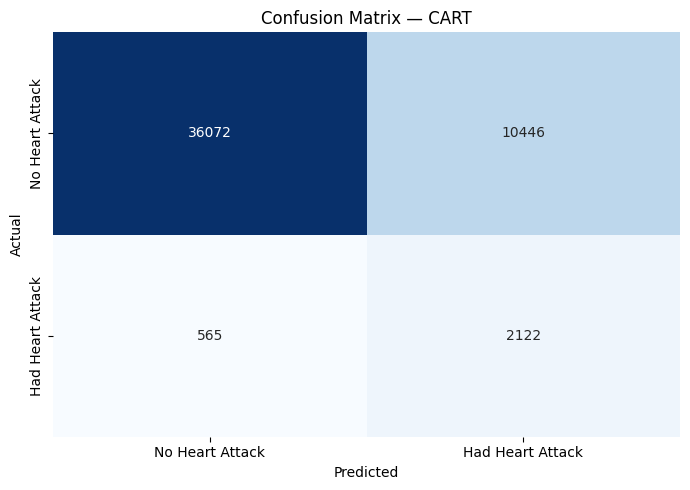

In [55]:
y_pred_cart  = cart_model.predict(X_test)
y_proba_cart = cart_model.predict_proba(X_test)[:, 1]

print('Classification Report — CART:')
print(classification_report(y_test, y_pred_cart,
                             target_names=['No Heart Attack', 'Had Heart Attack']))

plt.figure(figsize=(7, 5))
sns.heatmap(confusion_matrix(y_test, y_pred_cart), annot=True, fmt='d',
            cmap='Blues', cbar=False,
            xticklabels=['No Heart Attack', 'Had Heart Attack'],
            yticklabels=['No Heart Attack', 'Had Heart Attack'])
plt.title('Confusion Matrix — CART')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.tight_layout()
plt.show()


## Evaluation: ROC & Precision-Recall Curves

ROC-AUC Score : 0.8641
PR-AUC Score  : 0.3917


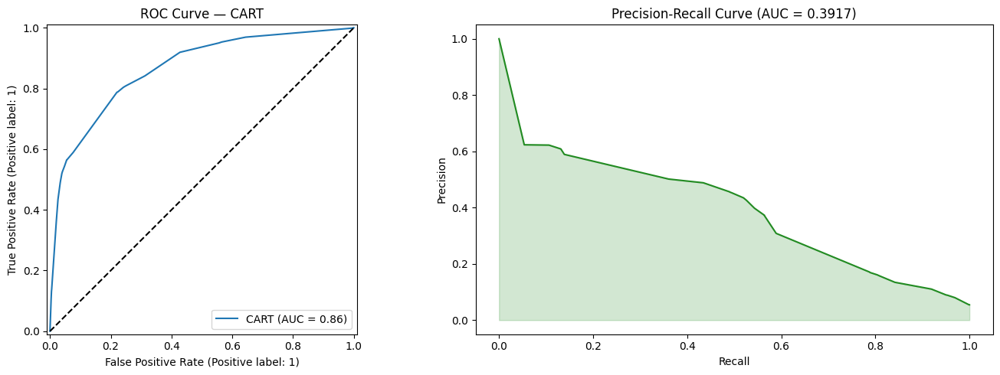

In [56]:
roc_cart = roc_auc_score(y_test, y_proba_cart)
precision_cart, recall_cart, _ = precision_recall_curve(y_test, y_proba_cart)
pr_auc_cart = auc(recall_cart, precision_cart)

print(f'ROC-AUC Score : {roc_cart:.4f}')
print(f'PR-AUC Score  : {pr_auc_cart:.4f}')

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

RocCurveDisplay.from_predictions(y_test, y_proba_cart, ax=axes[0], name='CART')
axes[0].plot([0, 1], [0, 1], 'k--')
axes[0].set_title('ROC Curve — CART')

axes[1].plot(recall_cart, precision_cart, color='forestgreen')
axes[1].fill_between(recall_cart, precision_cart, alpha=0.2, color='forestgreen')
axes[1].set_xlabel('Recall')
axes[1].set_ylabel('Precision')
axes[1].set_title(f'Precision-Recall Curve (AUC = {pr_auc_cart:.4f})')

plt.tight_layout()
plt.show()


## CART Feature Importance (Gini Impurity)

Features used by tree: 13
                  feature  importance
                HadAngina     0.65568
                ChestScan     0.15128
              AgeCategory     0.08088
            GeneralHealth     0.05571
                HadStroke     0.04750
        DifficultyWalking     0.00576
SmokerStatus_Never smoked     0.00121
                      Sex     0.00093
       PhysicalHealthDays     0.00062
         RemovedTeeth_All     0.00022
                      BMI     0.00010
        WeightInKilograms     0.00007
           HeightInMeters     0.00005


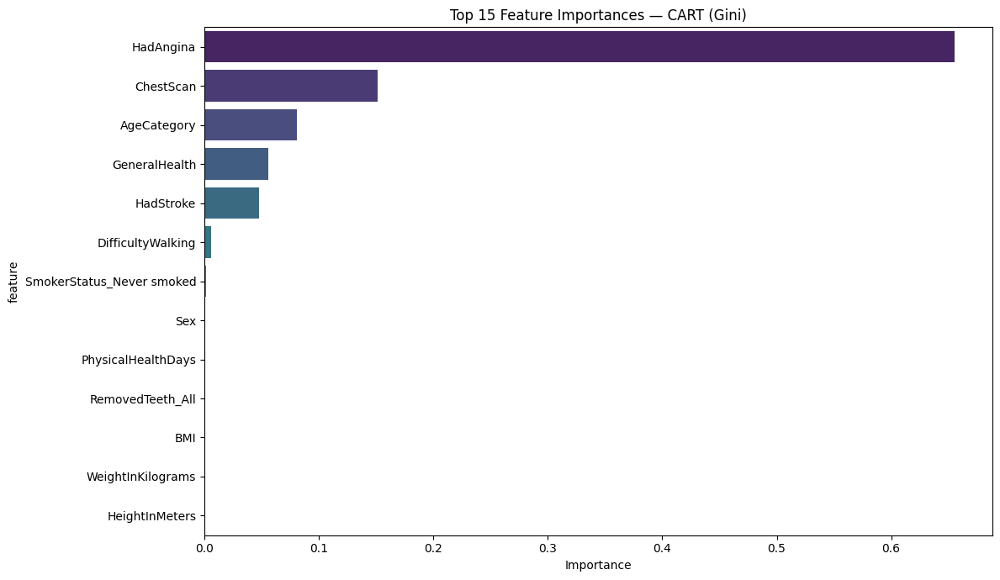

In [57]:
cart_importance = pd.DataFrame({
    'feature'   : X_train.columns,
    'importance': cart_model.feature_importances_
}).sort_values('importance', ascending=False)

# Keep only features the tree actually used
cart_importance_used = cart_importance[cart_importance['importance'] > 0]
print(f'Features used by tree: {len(cart_importance_used)}')
print(cart_importance_used.head(15).round(5).to_string(index=False))

plt.figure(figsize=(12, 7))
sns.barplot(data=cart_importance_used.head(15),
            x='importance', y='feature', palette='viridis')
plt.title('Top 15 Feature Importances — CART (Gini)')
plt.xlabel('Importance')
plt.tight_layout()
plt.show()


## Model Comparison: RF vs LR vs CART

                     ROC-AUC  PR-AUC  F1 (HA)  Recall (HA)  Precision (HA)
Model                                                                     
Random Forest         0.8778  0.3920   0.2042       0.1228          0.6055
Logistic Regression   0.8856  0.4018   0.3339       0.7652          0.2135
CART                  0.8641  0.3917   0.2782       0.7897          0.1688


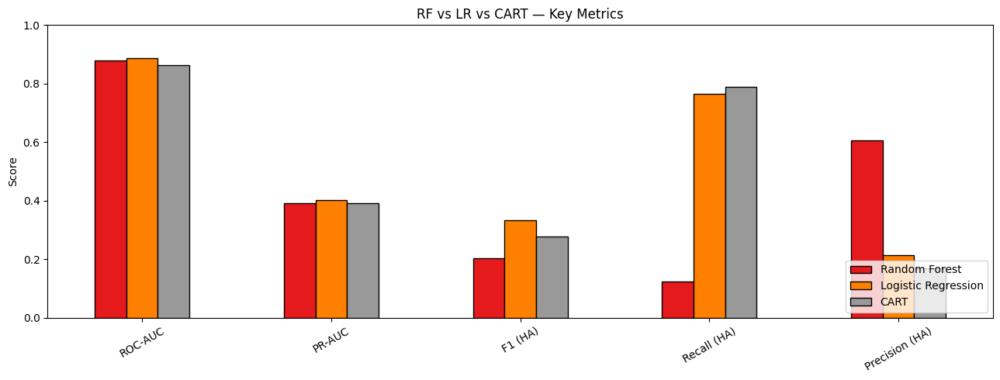

In [58]:
all_metrics = {
    'Model'         : ['Random Forest', 'Logistic Regression', 'CART'],
    'ROC-AUC'       : [roc_auc_score(y_test, y_proba),
                        roc_auc_score(y_test, y_proba_lr),
                        roc_cart],
    'PR-AUC'        : [pr_auc, pr_auc_lr, pr_auc_cart],
    'F1 (HA)'       : [f1_score(y_test, y_pred,       pos_label=1),
                        f1_score(y_test, y_pred_lr,    pos_label=1),
                        f1_score(y_test, y_pred_cart,  pos_label=1)],
    'Recall (HA)'   : [recall_score(y_test, y_pred,      pos_label=1),
                        recall_score(y_test, y_pred_lr,   pos_label=1),
                        recall_score(y_test, y_pred_cart, pos_label=1)],
    'Precision (HA)': [precision_score(y_test, y_pred,      pos_label=1),
                        precision_score(y_test, y_pred_lr,   pos_label=1),
                        precision_score(y_test, y_pred_cart, pos_label=1)],
}

all_comp = pd.DataFrame(all_metrics).set_index('Model').round(4)
print(all_comp.to_string())

all_comp.T.plot(kind='bar', figsize=(13, 5),
                colormap='Set1', edgecolor='black')
plt.title('RF vs LR vs CART — Key Metrics')
plt.ylabel('Score')
plt.xticks(rotation=30)
plt.ylim(0, 1)
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


# Explainability — CART
## SHAP: Beeswarm Plot

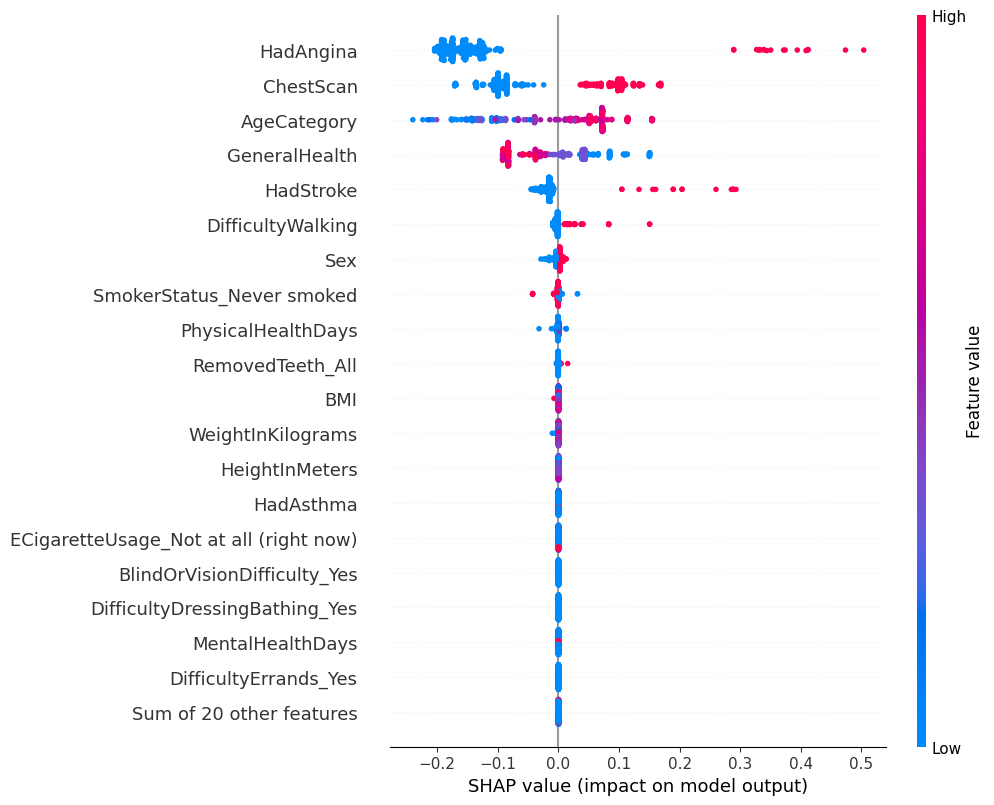

In [59]:
X_shap_cart = X_test.sample(300, random_state=42).astype(float)

explainer_cart = shap.TreeExplainer(cart_model)
shap_values_cart = explainer_cart(X_shap_cart)

# Class 1 = Had Heart Attack
shap.plots.beeswarm(shap_values_cart[:, :, 1], max_display=20)


## SHAP: Bar Summary (Mean |SHAP|)

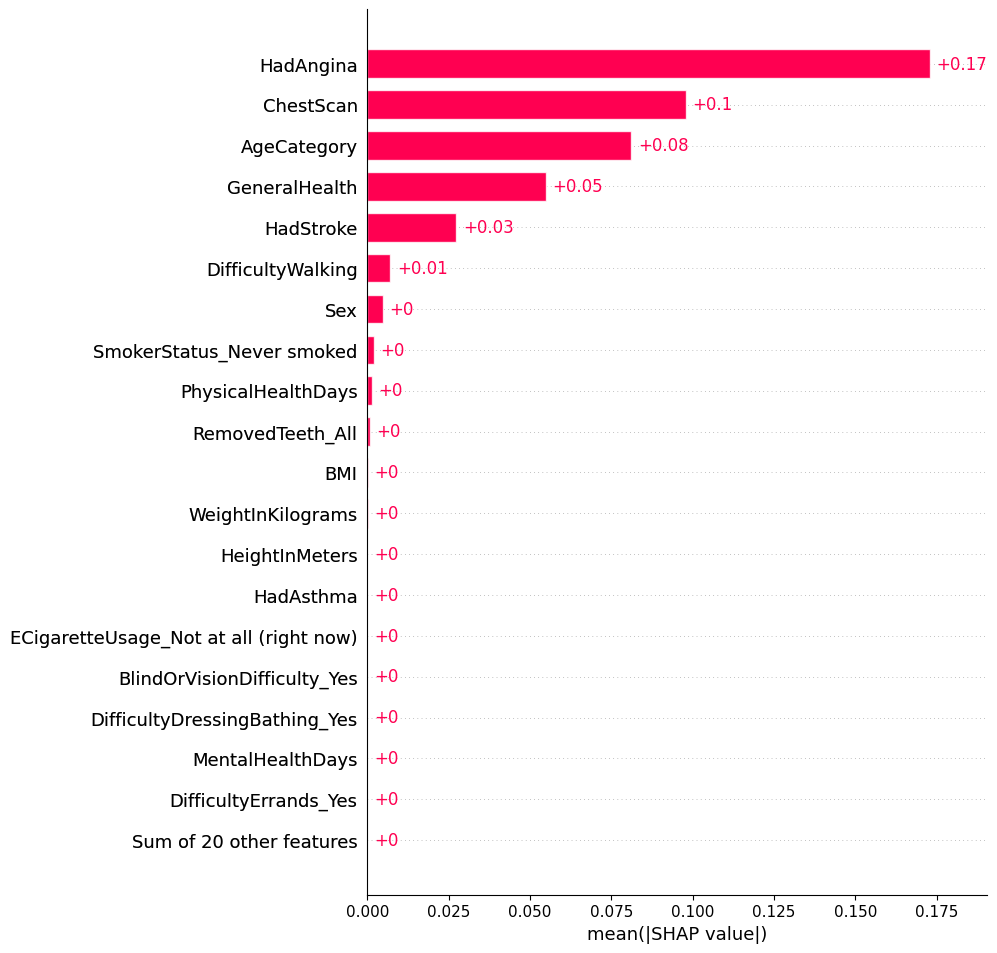

In [60]:
shap.plots.bar(shap_values_cart[:, :, 1], max_display=20)


## SHAP: Waterfall Plot — Single Instance

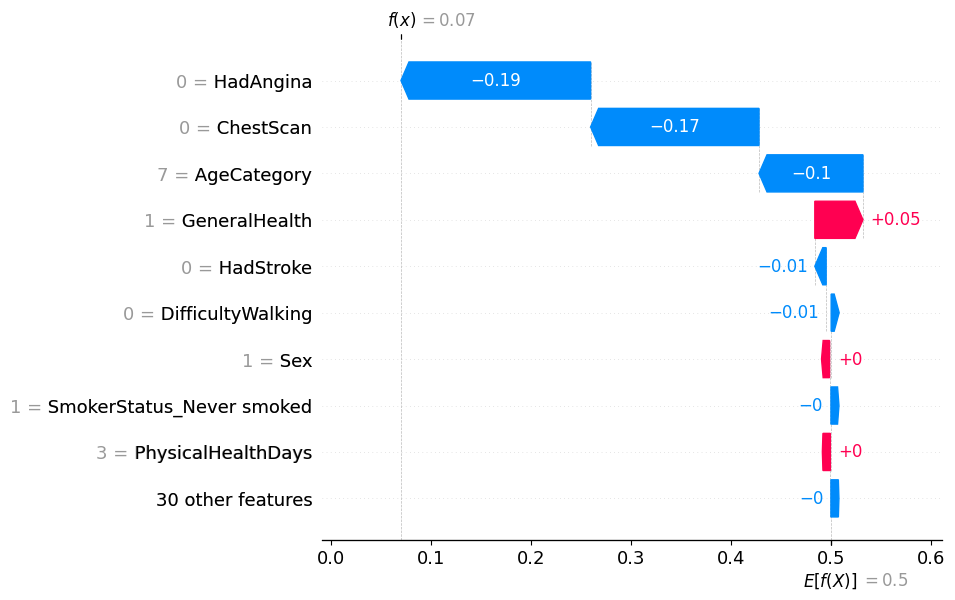

In [61]:
shap.plots.waterfall(shap_values_cart[:, :, 1][0])


## SHAP: Decision Plot — Multiple Instances

shap_vals_arr[1] shape : (39, 2)
X_shap_cart shape      : (300, 39)
X_shap_cart columns    : 39


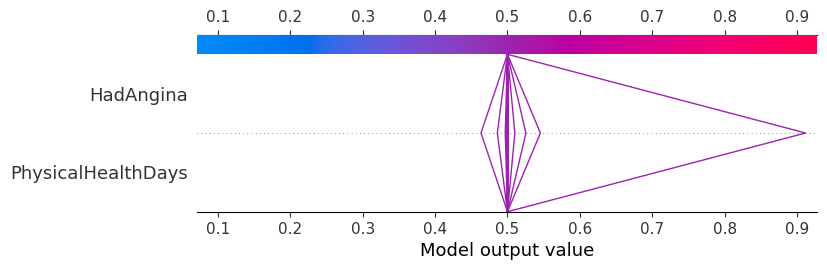

In [68]:

shap_vals_arr = explainer_cart.shap_values(X_shap_cart)

print(f"shap_vals_arr[1] shape : {shap_vals_arr[1].shape}")
print(f"X_shap_cart shape      : {X_shap_cart.shape}")
print(f"X_shap_cart columns    : {X_shap_cart.shape[1]}")

# Use n_features from shap values directly — they must match
n_features = shap_vals_arr[1].shape[1]
feature_names_cart = X_shap_cart.columns.tolist()[:n_features]

shap.decision_plot(
    explainer_cart.expected_value[1],
    shap_vals_arr[1][:50],
    features=X_shap_cart.iloc[:50, :n_features],
    feature_names=feature_names_cart,
    show=True
)

## LIME: Local Explanation — CART

In [69]:
lime_explainer_cart = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns.tolist(),
    class_names=['No Heart Attack', 'Heart Attack'],
    mode='classification'
)

# Pick a true positive instance
pos_indices_cart = y_test[y_test == 1].index
sample_idx_cart  = X_test.index.get_loc(pos_indices_cart[0])

exp_cart = lime_explainer_cart.explain_instance(
    data_row=X_test.iloc[sample_idx_cart].values,
    predict_fn=cart_model.predict_proba
)

exp_cart.show_in_notebook(show_table=True)


## LIME: Top Features Bar Chart (CART)

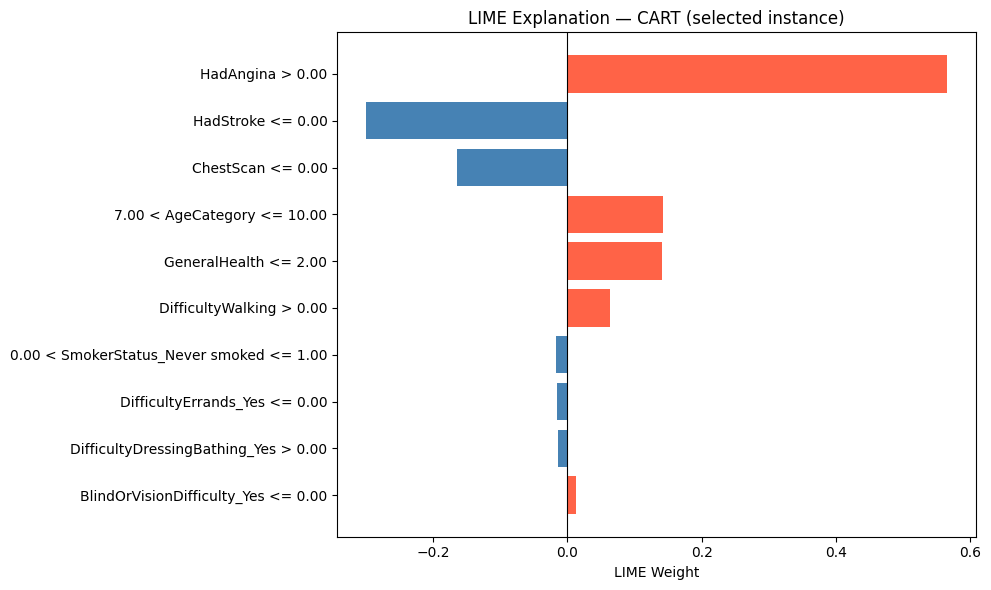

In [70]:
lime_features_cart = exp_cart.as_list()
lime_df_cart = pd.DataFrame(lime_features_cart, columns=['Feature', 'Weight'])
lime_df_cart = lime_df_cart.sort_values('Weight', key=abs, ascending=False)

colors_lime_cart = ['tomato' if w > 0 else 'steelblue' for w in lime_df_cart['Weight']]

plt.figure(figsize=(10, 6))
plt.barh(lime_df_cart['Feature'][::-1], lime_df_cart['Weight'][::-1],
         color=colors_lime_cart[::-1])
plt.axvline(0, color='black', linewidth=0.8)
plt.title('LIME Explanation — CART (selected instance)')
plt.xlabel('LIME Weight')
plt.tight_layout()
plt.show()


## Partial Dependence Plots (PDP) — CART

PDP features: ['AgeCategory', 'GeneralHealth', 'PhysicalHealthDays', 'BMI', 'WeightInKilograms', 'HeightInMeters']


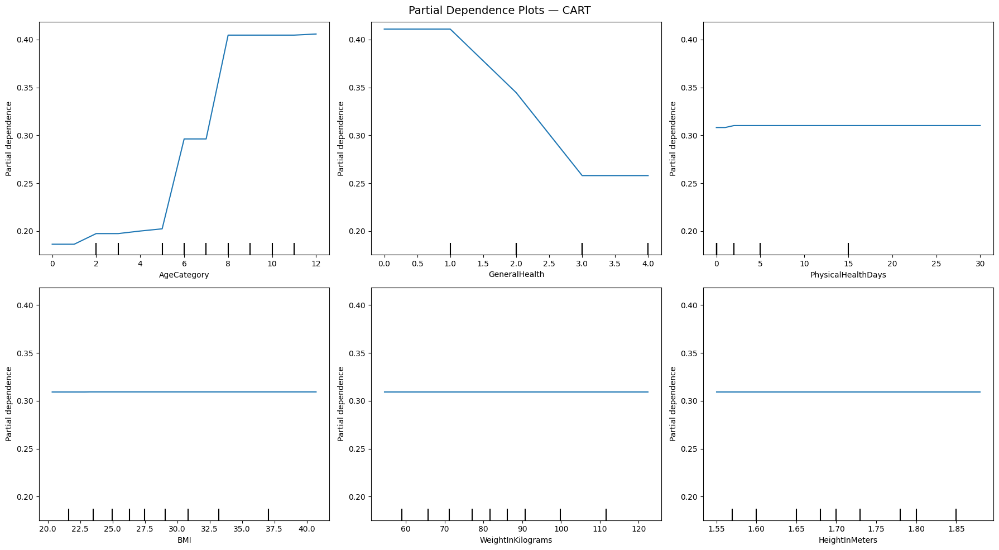

In [71]:
# Use top features actually used by the tree (non-zero importance, continuous)
binary_like_cart = [c for c in X_train.columns if X_train[c].nunique() <= 2]
pdp_features_cart = [
    f for f in cart_importance_used['feature'].tolist()
    if f not in binary_like_cart
][:6]
print('PDP features:', pdp_features_cart)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
PartialDependenceDisplay.from_estimator(
    cart_model,
    X_train,
    features=pdp_features_cart,
    kind='average',
    ax=axes.flatten(),
    grid_resolution=50,
    random_state=42
)
plt.suptitle('Partial Dependence Plots — CART', fontsize=14)
plt.tight_layout()
plt.show()


## ICE + PDP — CART (Top 3 features)

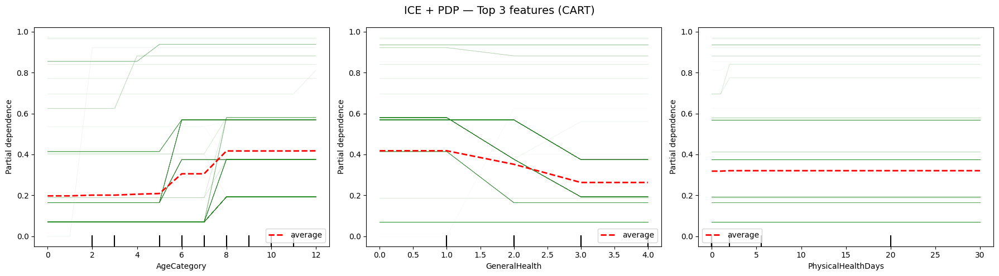

In [74]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
PartialDependenceDisplay.from_estimator(
    cart_model,
    X_train.sample(500, random_state=42),
    features=pdp_features_cart[:3],
    kind='both',
    ax=axes,
    grid_resolution=30,
    random_state=42,
    ice_lines_kw={'alpha': 0.05, 'color': 'forestgreen'},
    pd_line_kw={'color': 'red', 'linewidth': 2}
)
plt.suptitle('ICE + PDP — Top 3 features (CART)', fontsize=14)
plt.tight_layout()
plt.show()


## 2-D PDP Interaction — CART

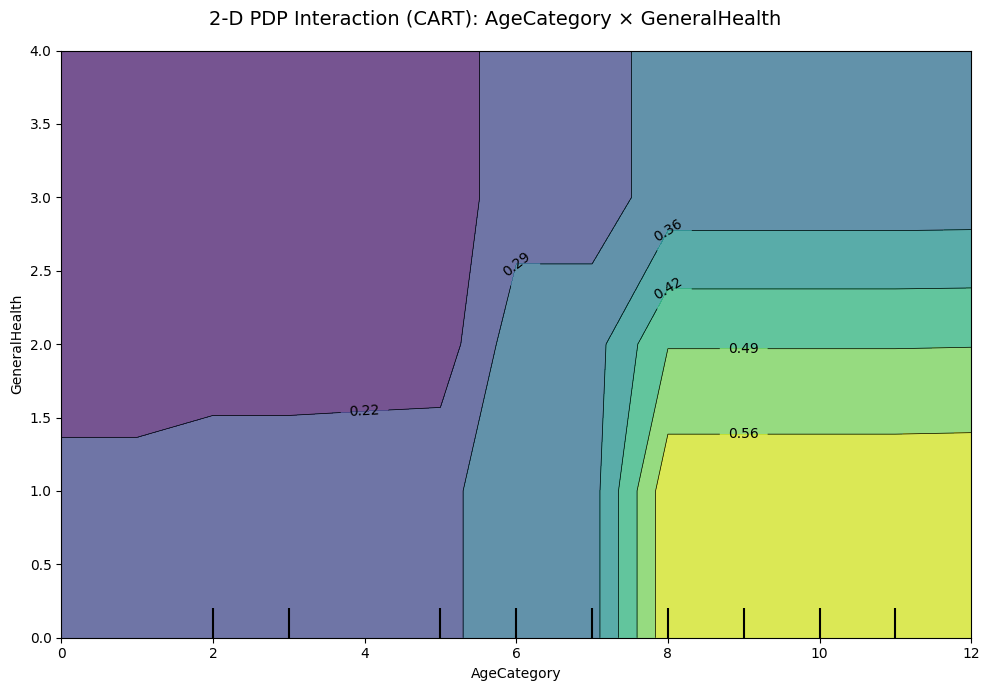

In [75]:
interact_features_cart = [(pdp_features_cart[0], pdp_features_cart[1])]

fig, ax = plt.subplots(figsize=(10, 7))
PartialDependenceDisplay.from_estimator(
    cart_model,
    X_train,
    features=interact_features_cart,
    kind='average',
    ax=[ax],
    grid_resolution=20,
    random_state=42
)
plt.suptitle(f'2-D PDP Interaction (CART): {pdp_features_cart[0]} × {pdp_features_cart[1]}',
             fontsize=14)
plt.tight_layout()
plt.show()


## LOFO — Leave One Feature Out Importance (ROC-AUC, CART)

In [76]:
baseline_auc_cart = roc_auc_score(y_test, y_proba_cart)
print(f'Baseline ROC-AUC (CART): {baseline_auc_cart:.4f}')

lofo_cart_records = []

for feat in X_train.columns:
    X_tr_lo = X_train.drop(columns=[feat])
    X_te_lo = X_test.drop(columns=[feat])

    cart_lo = DecisionTreeClassifier(
        max_depth=5, class_weight='balanced',
        criterion='gini', random_state=42
    )
    cart_lo.fit(X_tr_lo, y_train)
    auc_lo = roc_auc_score(y_test, cart_lo.predict_proba(X_te_lo)[:, 1])
    lofo_cart_records.append({
        'feature': feat,
        'auc_without': auc_lo,
        'importance': baseline_auc_cart - auc_lo
    })

lofo_cart_df = (pd.DataFrame(lofo_cart_records)
                  .sort_values('importance', ascending=False)
                  .reset_index(drop=True))
lofo_cart_df['rank'] = lofo_cart_df.index + 1
print('\nLOFO Results — CART (top 20):')
print(lofo_cart_df.head(20).round(5).to_string(index=False))


Baseline ROC-AUC (CART): 0.8641

LOFO Results — CART (top 20):
                                                            feature  auc_without  importance  rank
                                                          HadAngina      0.81564     0.04843     1
                                                          ChestScan      0.85776     0.00630     2
                                                        AgeCategory      0.86043     0.00363     3
                                                      GeneralHealth      0.86184     0.00222     4
                                                   RemovedTeeth_All      0.86357     0.00049     5
                                                  DifficultyWalking      0.86378     0.00029     6
                                                 PhysicalActivities      0.86406     0.00000     7
                                              DifficultyErrands_Yes      0.86406     0.00000     8
                                              

## LOFO: Importance Bar Chart (CART)

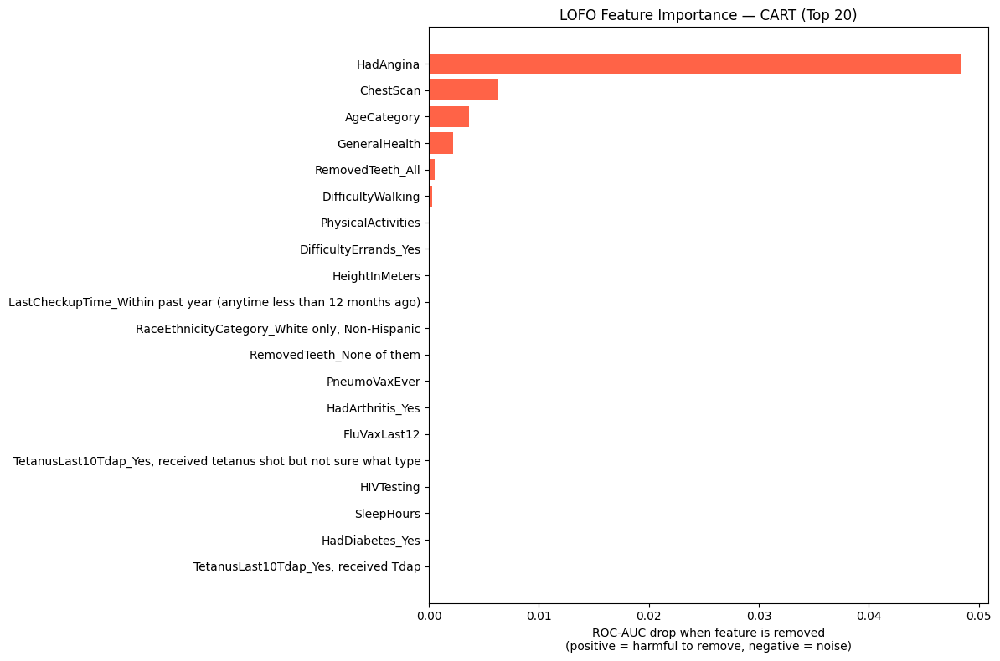

In [77]:
top_lofo_cart = lofo_cart_df.head(20)
colors_lofo_cart = ['tomato' if v > 0 else 'steelblue'
                     for v in top_lofo_cart['importance']]

plt.figure(figsize=(12, 8))
plt.barh(top_lofo_cart['feature'][::-1],
         top_lofo_cart['importance'][::-1],
         color=colors_lofo_cart[::-1])
plt.axvline(0, color='black', linewidth=0.8)
plt.xlabel('ROC-AUC drop when feature is removed\n'
           '(positive = harmful to remove, negative = noise)')
plt.title('LOFO Feature Importance — CART (Top 20)')
plt.tight_layout()
plt.show()


## LOFO: Noisy / Redundant Features (CART)

In [78]:
noisy_cart = lofo_cart_df[lofo_cart_df['importance'] < 0].sort_values('importance')
if len(noisy_cart):
    print(f'Features whose removal IMPROVES AUC ({len(noisy_cart)} total):')
    print(noisy_cart.round(5).to_string(index=False))
else:
    print('No noisy features found — all features contribute positively.')


Features whose removal IMPROVES AUC (5 total):
                  feature  auc_without  importance  rank
                HadStroke      0.86544    -0.00137    39
SmokerStatus_Never smoked      0.86444    -0.00038    38
                      Sex      0.86418    -0.00012    37
       PhysicalHealthDays      0.86412    -0.00006    36
                      BMI      0.86408    -0.00002    35
